# Introduction

When doing my Q0 variable inspection, I noticed a source that had the lightcurve and CMD appearance of a close EB. 

Let's figure out if a period can be found for it.

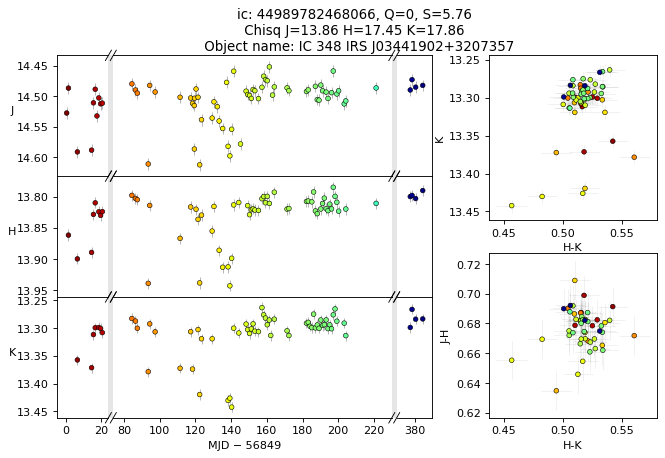

In [24]:
import numpy as np 
from astropy.coordinates import SkyCoord
from astropy.timeseries import LombScargle

from wuvars.analysis.bd_matching_v3 import match_ngc, match_ic
from wuvars.data import photometry, quality_classes, spreadsheet
from wuvars.plotting.lightcurve import simple_lc, simple_lc_brokenaxes, ic348_simple_lc_brokenaxes, ic348_simple_lc_scatter_brokenaxes, ngc1333_simple_lc_scatter_brokenaxes
from wuvars.analysis.spectral_type_to_number import get_num_from_SpT, get_SpT_from_num
from wuvars.analysis.periods import N_eval, f_max, f_min
from wuvars.analysis.alias_hunting import (find_aliases, find_m_aliases,
                                           find_n_aliases)
from wuvars.analysis.detrending import poly_detrend


In [25]:
import warnings
warnings.filterwarnings("ignore")

In [28]:
freq = np.linspace(f_min, f_max, N_eval)


In [23]:
ic_match = match_ic()
ic_dat = photometry.group_wserv_v2(photometry.load_wserv_v2(8))

Loading WSERV8 photometry data... DONE (elapsed time: 0.25s)


# Its properties

SIMBAD link for this object:
https://simbad.cds.unistra.fr/simbad/sim-id?Ident=%40658494&Name=Cl*%20IC%20%20348%20%20%20%20%20%20H%20%20%20%20%20%2082&submit=submit

In [290]:
sid = 44989782468066

for row in ic_match.approved:
    if row['SOURCEID'] == sid:
#         print(row)
        print(f"Name: {row['Name']}")
        print(f"    AKA: {row['Luhman']}")
        print(f"    AKA: {row['Evans']}")
        print(f"    AKA: {row['OtherNames']}")
        print(f"UKIRT SOURCEID: {row['SOURCEID']}")
        c = SkyCoord(ra= row['median_RA'], dec=row['median_DEC'], unit=u.rad)
        print(f"RA/Dec: {c.to_string('hmsdms')}")    
        print(f"RA/Dec: {c.to_string('decimal', precision=6)}")    
        print(f"JHK mags: J={row['median_JAPERMAG3']:.2f} H={row['median_HAPERMAG3']:.2f} K={row['median_KAPERMAG3']:.2f}")            
        print(f"Spectral type: {row['Adopt']}")
        print(f"Infrared excess: {row['IRexc']}")

Name: IC 348 IRS J03441902+3207357
    AKA: LRL 99 B
    AKA: --
    AKA: --
UKIRT SOURCEID: 44989782468066
RA/Dec: 03h44m19.0105s +32d07m35.7258s
RA/Dec: 56.079210 32.126590
JHK mags: J=14.50 H=13.82 K=13.30
Spectral type: M5.25
Infrared excess: --


In [19]:
c.to_string('hmsdms')

'03h44m19.0105s +32d07m35.7258s'

# Its lightcurve



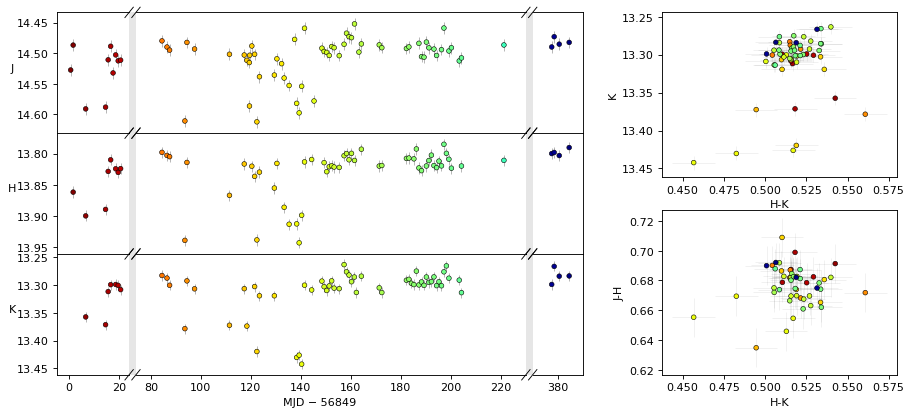

In [47]:
fig_lc = ic348_simple_lc_scatter_brokenaxes(ic_dat, sid, cmap='jet_r')
fig_lc.canvas.figure.set_size_inches(14, 6)

plt.show()
# fig_lc.suptitle(f"{name}: {sid} Object name: {source_name}")


[None]

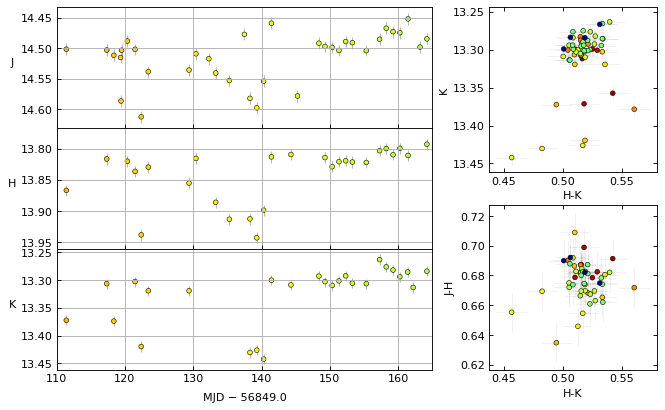

In [176]:
import matplotlib as mpl

mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'
mpl.rcParams['xtick.top'] = True
mpl.rcParams['ytick.right'] = True

fig_lc_all = simple_lc_scatter_brokenaxes(ic_dat, sid, cmap='jet_r', breaks=[])
fig_lc_all.ax_j.set_xlim(110, 165)
fig_lc_all.ax_h.set_xlim(110, 165)
fig_lc_all.ax_k.set_xlim(110, 165)

fig_lc_all.ax_j.grid(True)
fig_lc_all.ax_h.grid(True)
fig_lc_all.ax_k.grid(True)

[None]

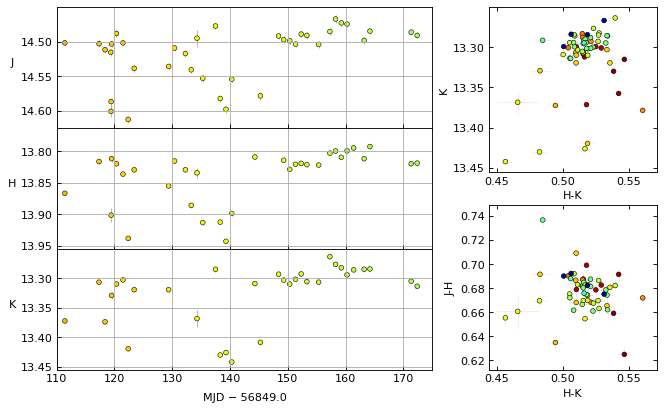

In [178]:
import matplotlib as mpl

mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'
mpl.rcParams['xtick.top'] = True
mpl.rcParams['ytick.right'] = True

fig_lc_all = simple_lc_scatter_brokenaxes(crudely_cleaned, sid, cmap='jet_r', breaks=[])
fig_lc_all.ax_j.set_xlim(110, 175)
fig_lc_all.ax_h.set_xlim(110, 175)
fig_lc_all.ax_k.set_xlim(110, 175)

fig_lc_all.ax_j.grid(True)
fig_lc_all.ax_h.grid(True)
fig_lc_all.ax_k.grid(True)

J Best fit period: 0.4968676504687138
m_aliases: [ 4.02521677  1.00630419  6.03782516  0.67086946  8.05043354  0.5031521
 10.06304193  0.40252168]
n_aliases: [1.01260839 3.01260839 0.01260839 4.01260839 0.98739161 5.01260839
 1.98739161 6.01260839 2.98739161 7.01260839]



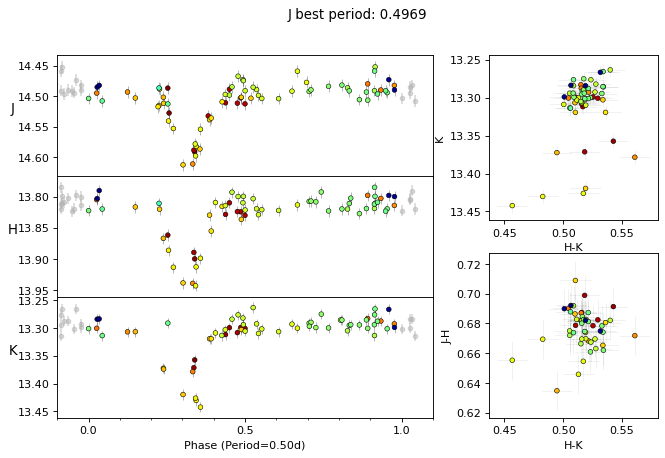

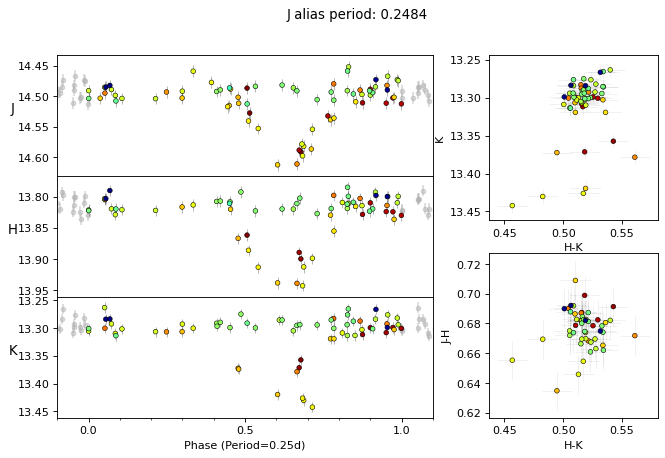

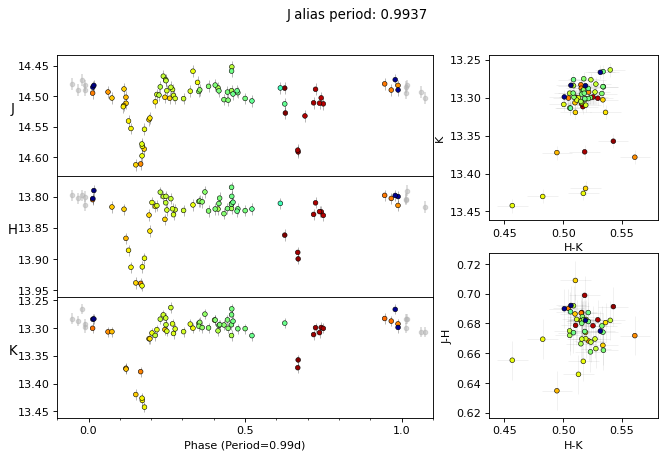

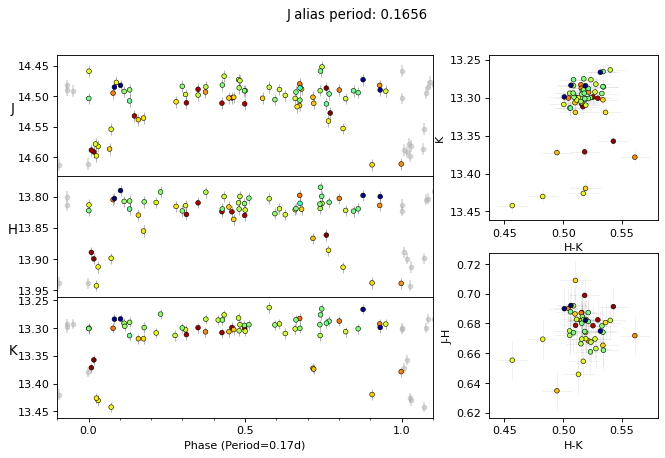

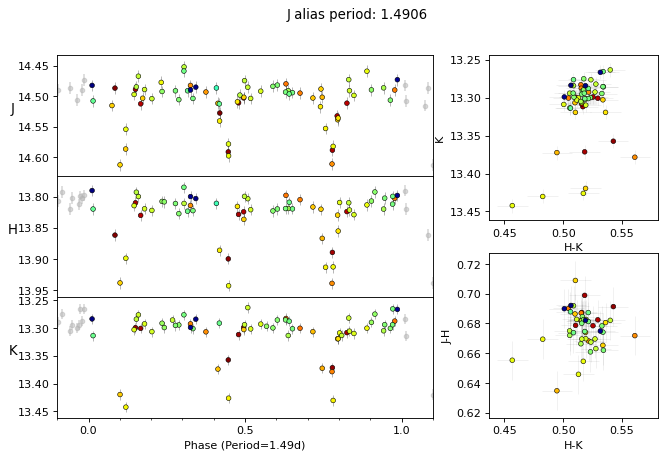

...

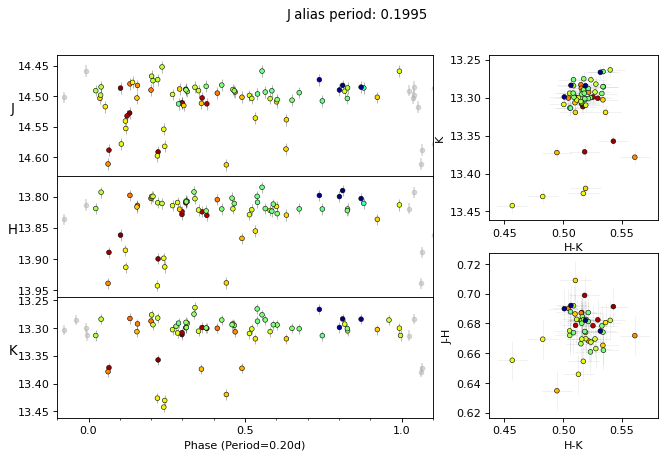

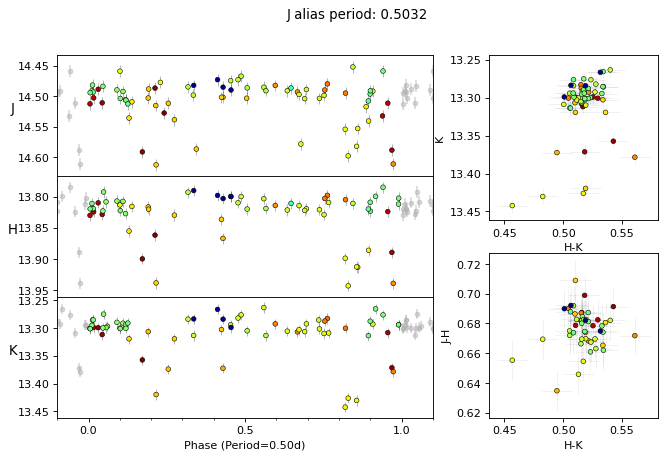

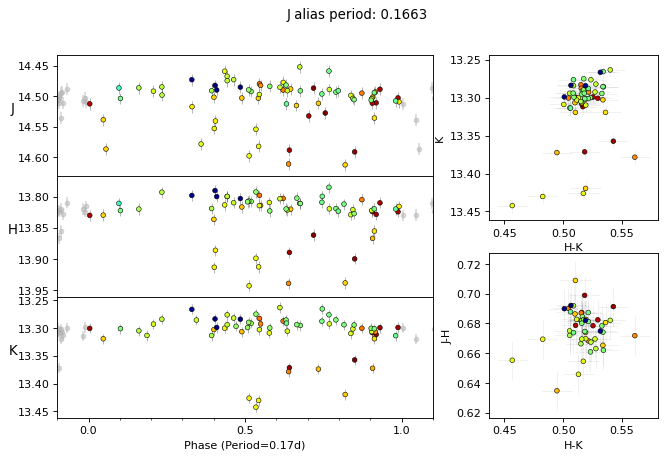

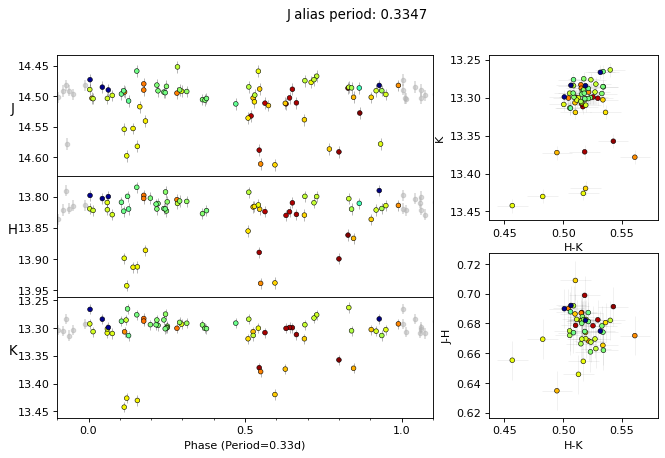

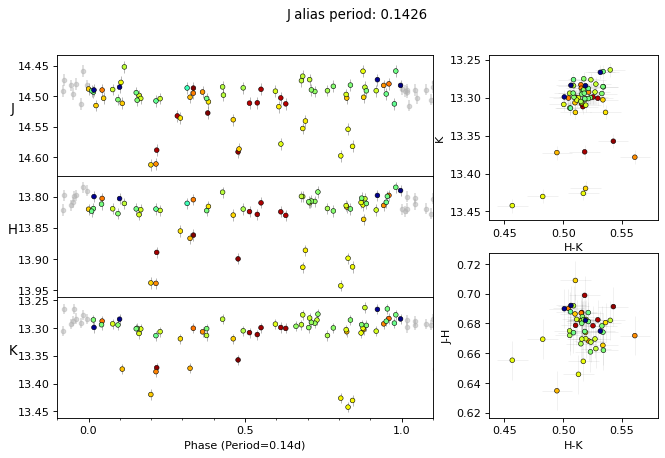

H Best fit period: 0.49689233954451345
m_aliases: [ 4.02501677  1.00625419  6.03752516  0.67083613  8.05003354  0.5031271
 10.06254193  0.40250168]
n_aliases: [1.01250839 3.01250839 0.01250839 4.01250839 0.98749161 5.01250839
 1.98749161 6.01250839 2.98749161 7.01250839]



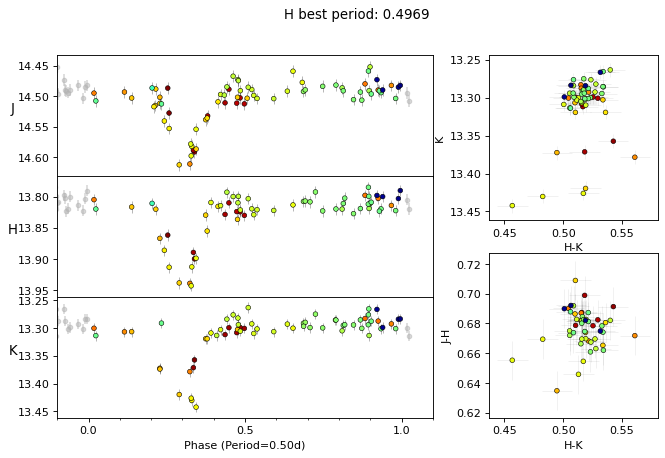

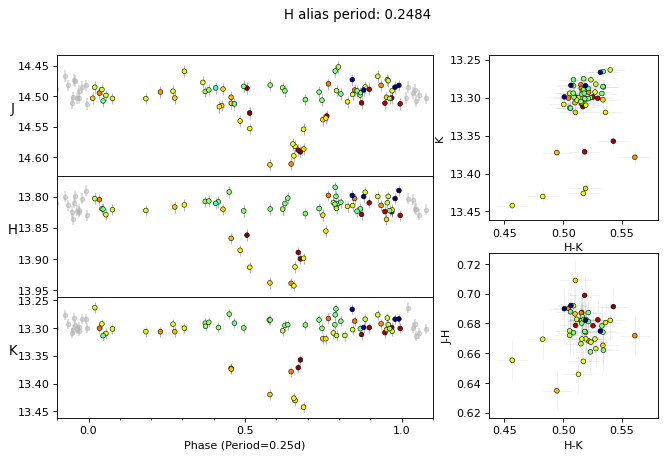

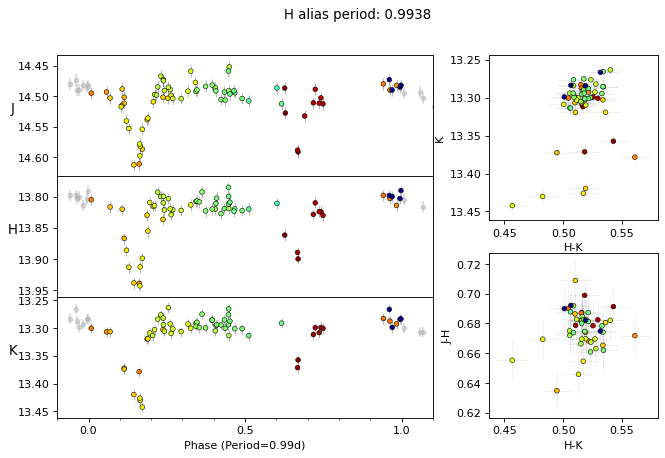

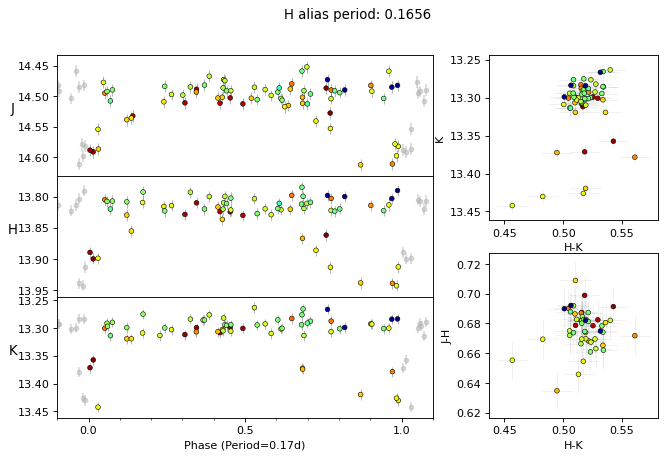

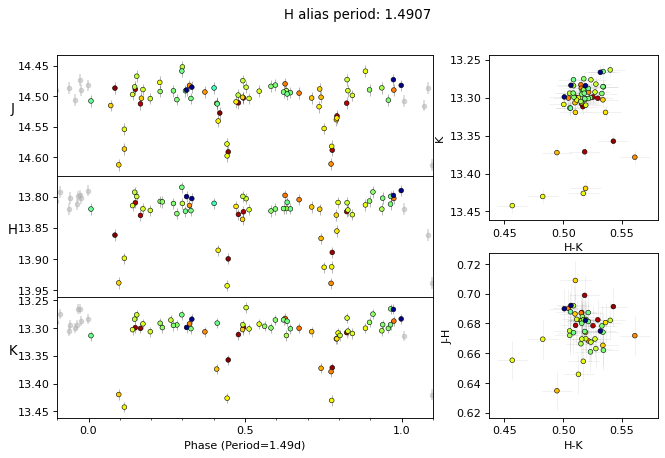

...

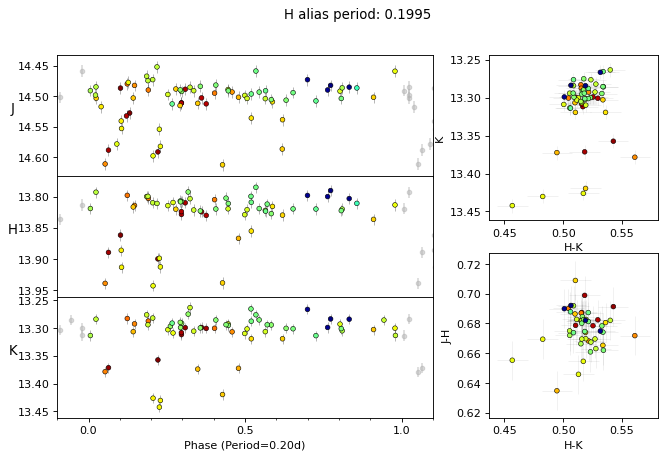

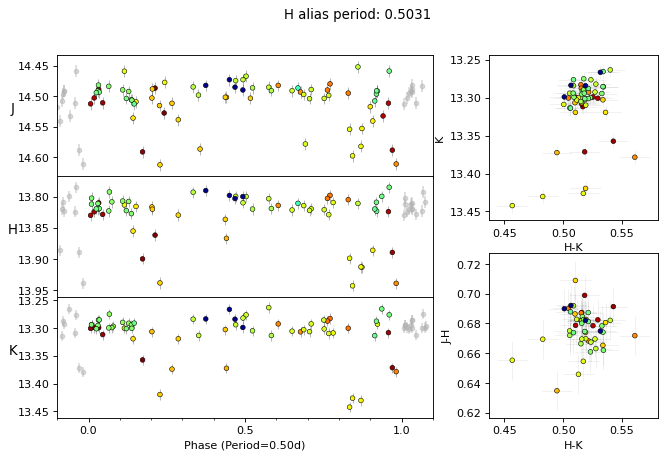

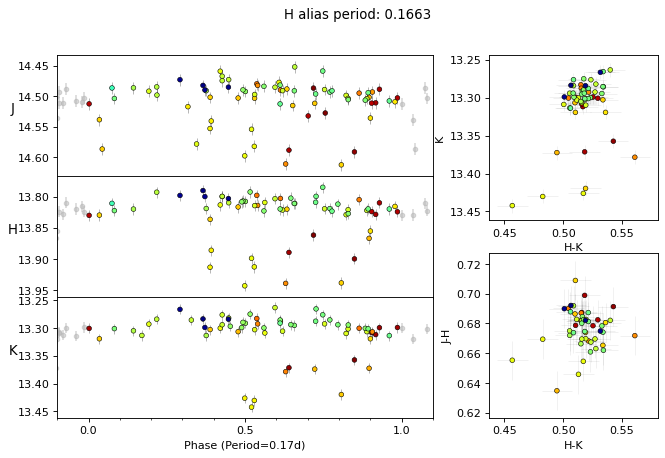

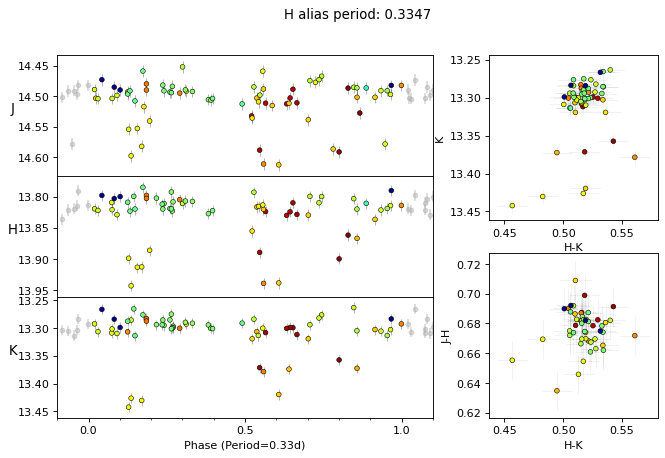

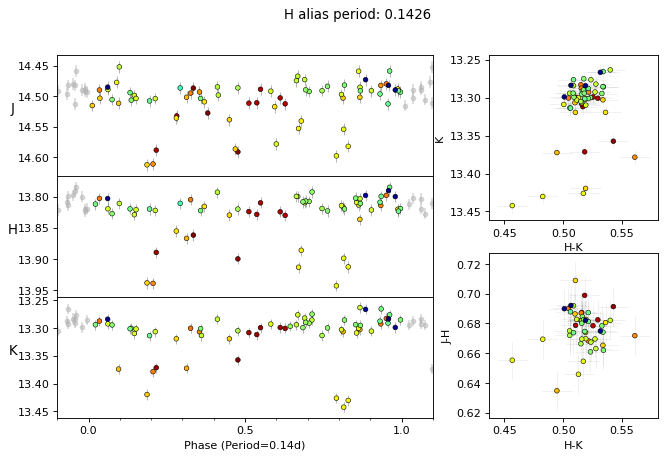

K Best fit period: 0.4969911203883174
m_aliases: [ 4.02421677  1.00605419  6.03632515  0.67070279  8.04843354  0.5030271
 10.06054192  0.40242168]
n_aliases: [1.01210838 3.01210838 0.01210838 4.01210838 0.98789162 5.01210838
 1.98789162 6.01210838 2.98789162 7.01210838]



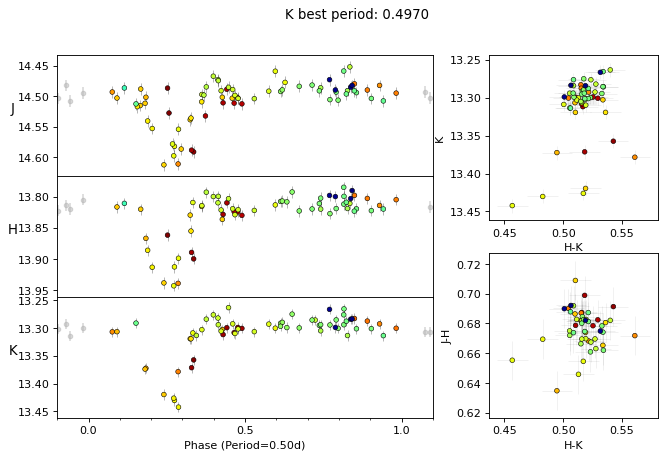

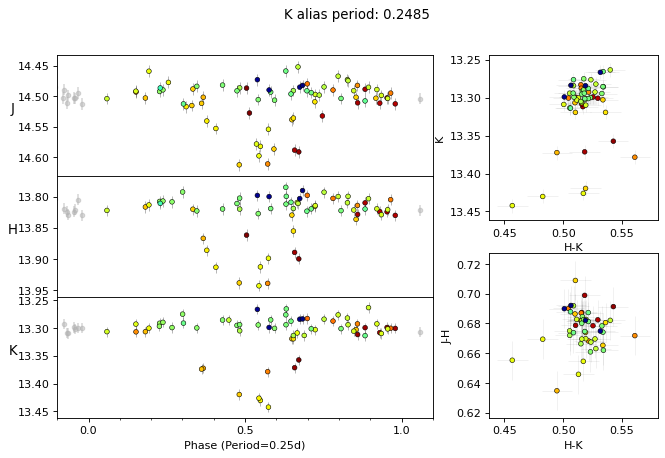

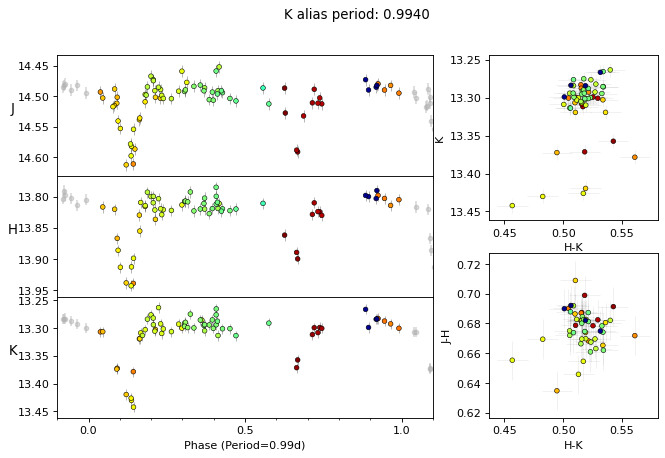

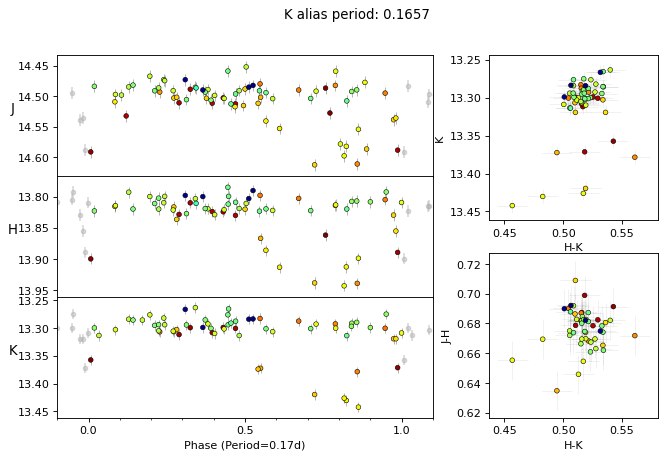

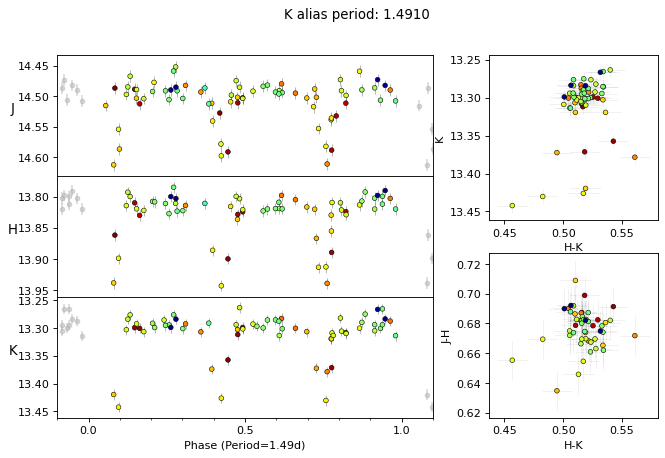

...

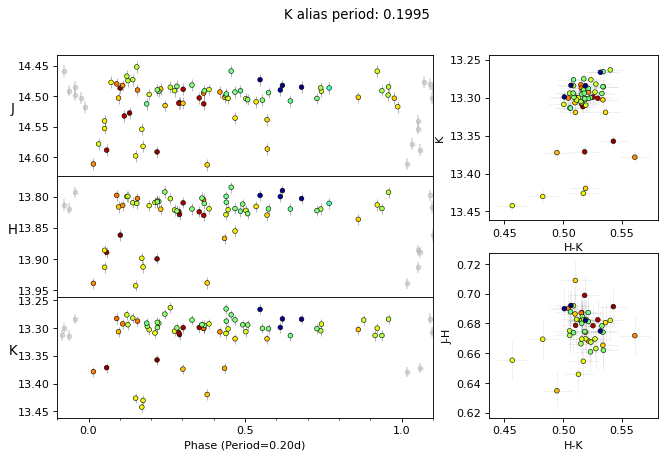

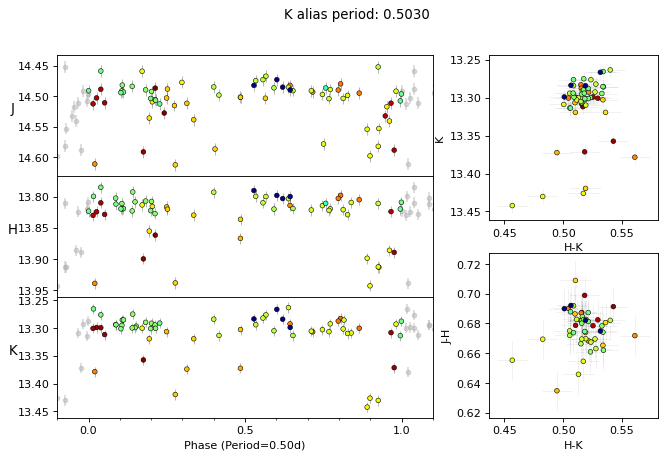

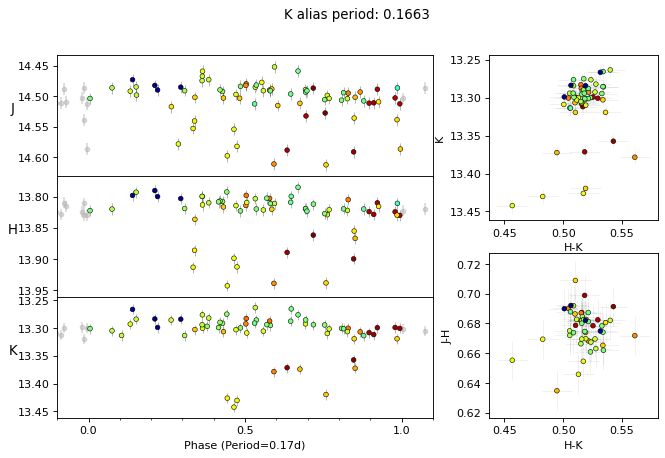

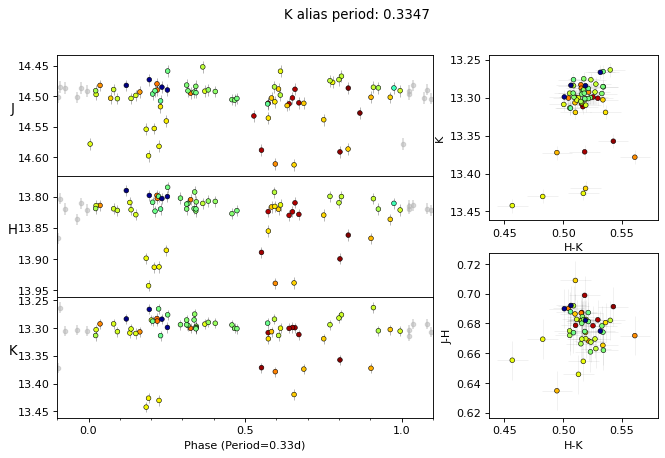

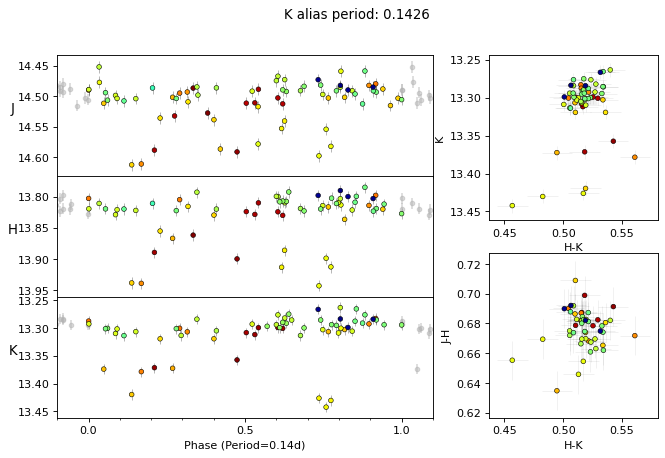

In [52]:
# let's do a LSP

dg = ic_dat
dat_raw = dg.groups[dg.groups.keys["SOURCEID"] == sid]
dat = dat_raw

bands = ["J", "H", "K"]

for band in bands:

    mask = dat[f"{band}APERMAG3"].mask
    times = dat["MEANMJDOBS"][~mask]
    mags_raw = dat[f"{band}APERMAG3"][~mask]
    errs = dat[f"{band}APERMAG3ERR"][~mask]
    
    mags = mags_raw
    
    
    ls = LombScargle(times, mags, dy=errs, nterms=4)
    power = ls.power(freq, assume_regular_frequency=True).value

    min_freq = 1 / 100
    power[freq < min_freq] = 0
    power[np.abs(freq - 1) < 0.01] = 0

    powermax = np.nanmax(power)
    fmax = freq[np.nanargmax(power)]
#     fap = ls.false_alarm_probability(np.nanmax(power)).value

    amp = np.sqrt(np.sum(ls.model_parameters(fmax)[1:3] ** 2))
    # print(ls.model_parameters(fmax), amp)

    # find aliases
    m_aliases = np.array(find_m_aliases(fmax, max_m=5))
    n_aliases = np.array(find_n_aliases(fmax, max_n=5))
    
    print(f"{band} Best fit period: {1/fmax}")
    print(f"m_aliases: {m_aliases}")
    print(f"n_aliases: {n_aliases}")
    print("")

    fig = simple_phased_lc_scatter_gridspec(
        ic_dat, sid, 1/fmax, cmap="jet_r"
    )
    fig.suptitle(f"{band} best period: {1/fmax:.4f}")
    
    for m_alias in m_aliases:
        
        fig = simple_phased_lc_scatter_gridspec(
            ic_dat, sid, 1/m_alias, cmap="jet_r"
        )
        fig.suptitle(f"{band} alias period: {1/m_alias:.4f}")    
        
    for n_alias in n_aliases:
        
        fig = simple_phased_lc_scatter_gridspec(
            ic_dat, sid, 1/n_alias, cmap="jet_r"
        )
        fig.suptitle(f"{band} alias period: {1/n_alias:.4f}")    
    plt.show()

# fig2 = 
# fig2.suptitle(f"{band} best period: {1/fmax:.3f}")
    
    


J Best fit period: 0.4968676504687138
m_aliases: [ 4.02521677  1.00630419  6.03782516  0.67086946  8.05043354  0.5031521
 10.06304193  0.40252168]
n_aliases: [1.01260839 3.01260839 0.01260839 4.01260839 0.98739161 5.01260839
 1.98739161 6.01260839 2.98739161 7.01260839]

H Best fit period: 0.49689233954451345
m_aliases: [ 4.02501677  1.00625419  6.03752516  0.67083613  8.05003354  0.5031271
 10.06254193  0.40250168]
n_aliases: [1.01250839 3.01250839 0.01250839 4.01250839 0.98749161 5.01250839
 1.98749161 6.01250839 2.98749161 7.01250839]

K Best fit period: 0.4969664214955438
m_aliases: [ 4.02441677  1.00610419  6.03662515  0.67073613  8.04883354  0.5030521
 10.06104192  0.40244168]
n_aliases: [1.01220838 3.01220838 0.01220838 4.01220838 0.98779162 5.01220838
 1.98779162 6.01220838 2.98779162 7.01220838]



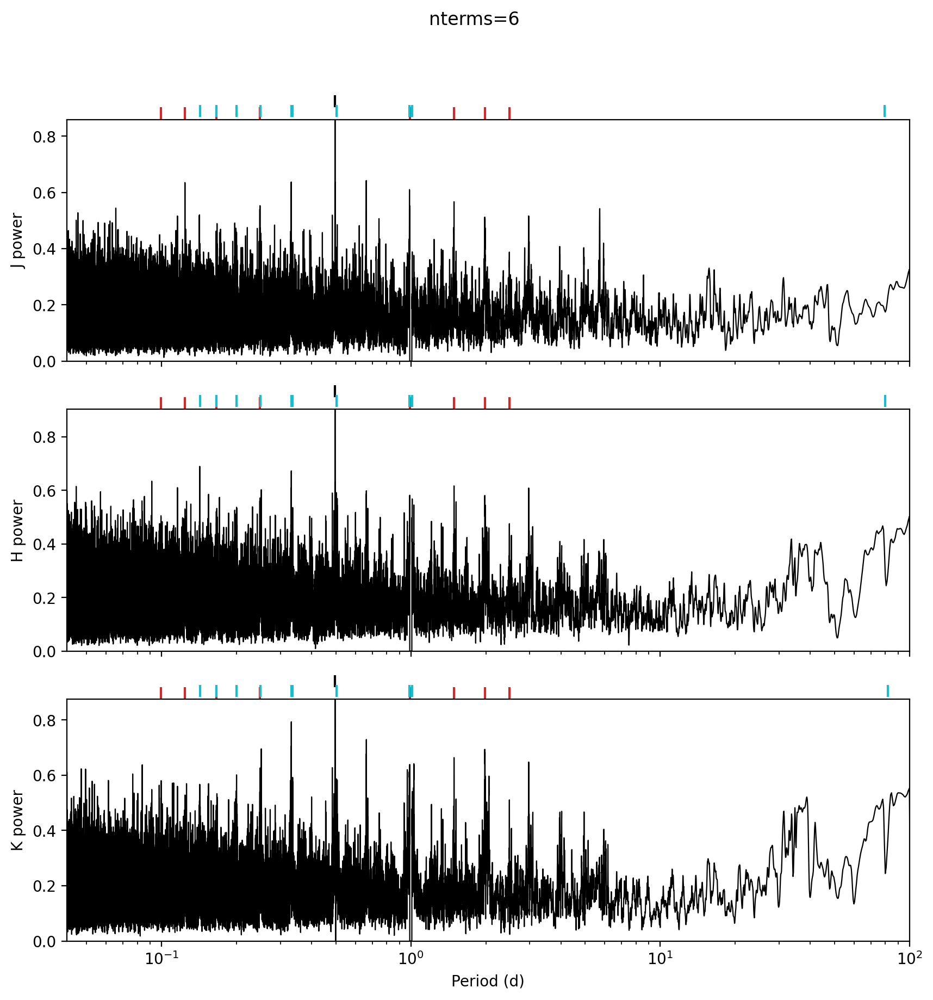

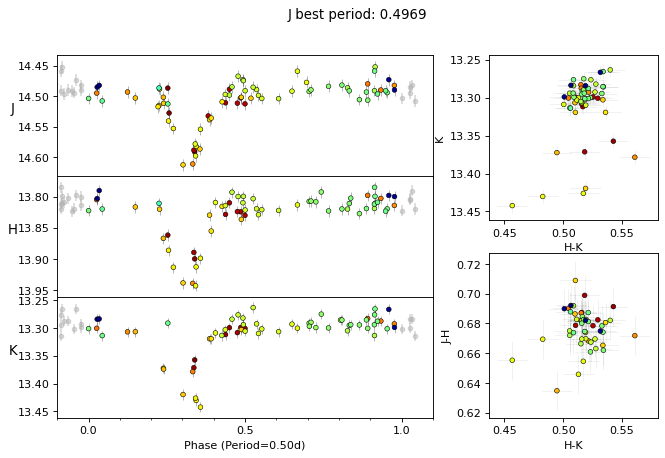

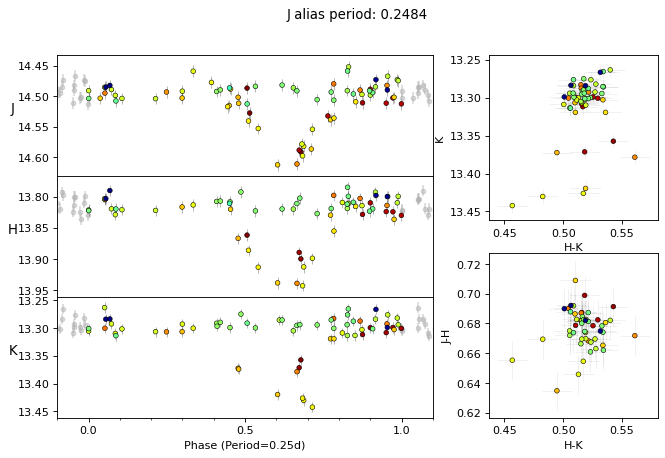

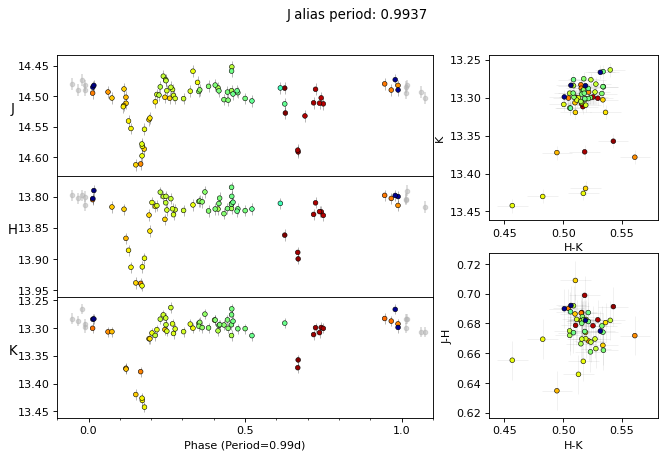

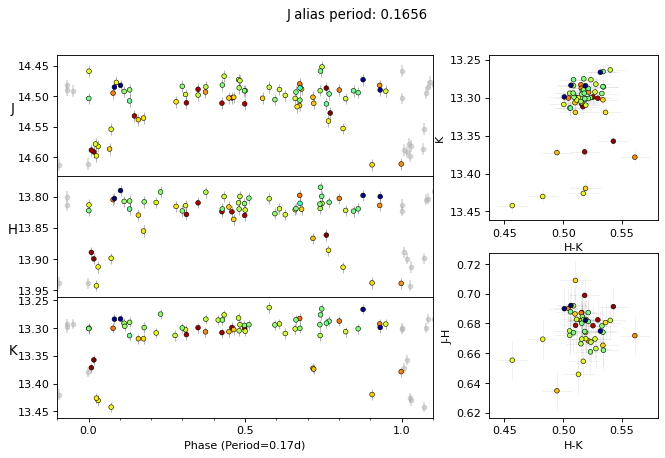

...

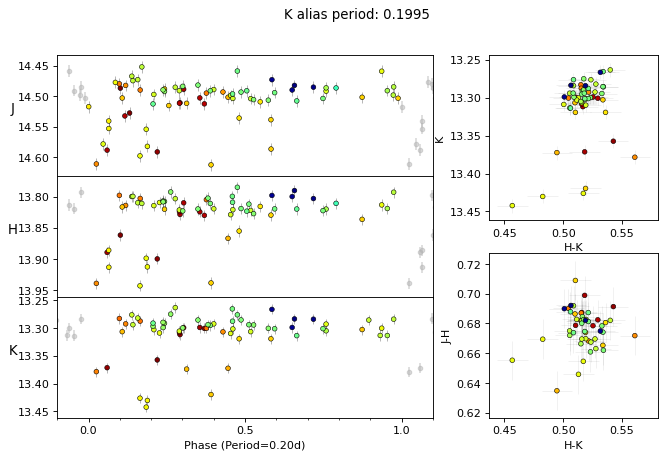

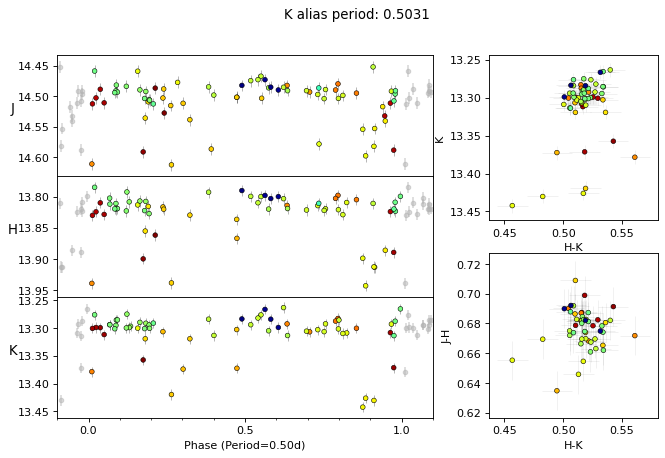

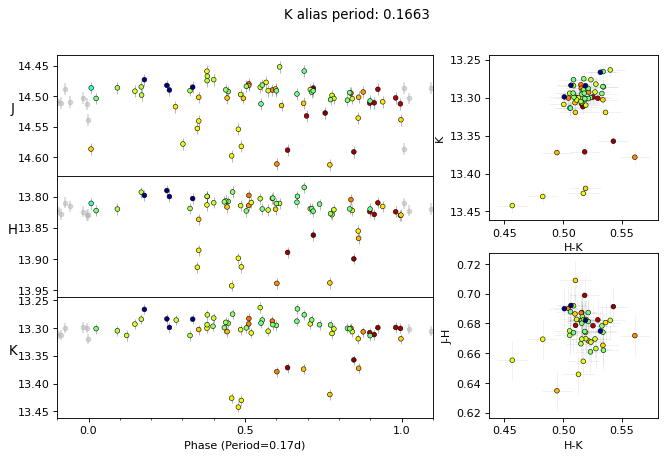

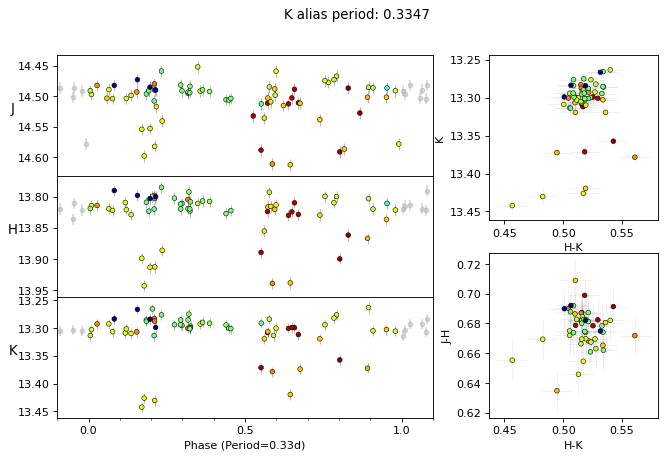

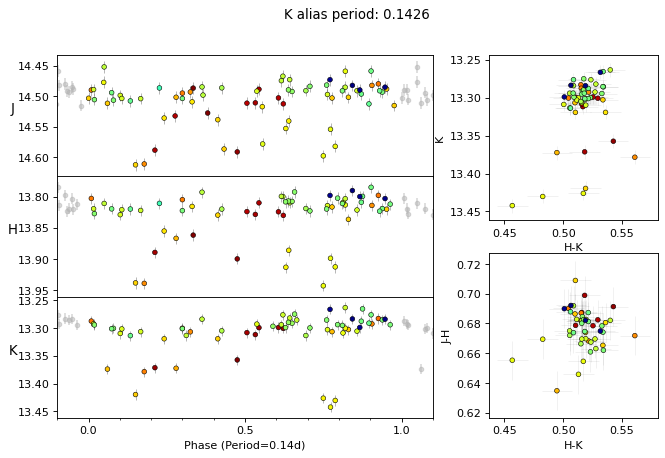

In [57]:
# let's do a LSP

dg = ic_dat
dat_raw = dg.groups[dg.groups.keys["SOURCEID"] == sid]
dat = dat_raw

fig, axes = plt.subplots(
    nrows=3, ncols=1, sharex=True, figsize=(10, 10), dpi=200
)
bands = ["J", "H", "K"]

for (band, ax) in zip(bands, axes):


    mask = dat[f"{band}APERMAG3"].mask
    times = dat["MEANMJDOBS"][~mask]
    mags_raw = dat[f"{band}APERMAG3"][~mask]
    errs = dat[f"{band}APERMAG3ERR"][~mask]
    
    mags = mags_raw
    
    nterms=6
    fig.suptitle(f"nterms={nterms}")
    ls = LombScargle(times, mags, dy=errs, nterms=nterms)
    power = ls.power(freq, assume_regular_frequency=True).value

    min_freq = 1 / 100
    power[freq < min_freq] = 0
    power[np.abs(freq - 1) < 0.01] = 0

    powermax = np.nanmax(power)
    fmax = freq[np.nanargmax(power)]
#     fap = ls.false_alarm_probability(np.nanmax(power)).value

    amp = np.sqrt(np.sum(ls.model_parameters(fmax)[1:3] ** 2))
    # print(ls.model_parameters(fmax), amp)

    # find aliases
    m_aliases = np.array(find_m_aliases(fmax, max_m=5))
    n_aliases = np.array(find_n_aliases(fmax, max_n=5))
    
    print(f"{band} Best fit period: {1/fmax}")
    print(f"m_aliases: {m_aliases}")
    print(f"n_aliases: {n_aliases}")
    print("")
    
    # plot the periodogram    

    ax.plot(1 / freq, power, "k", lw=0.8, rasterized=True)
    ax.set_ylabel(f"{band} power")
    if band == "K":
        ax.set_xlabel("Period (d)")
        ax.set_xscale("log")
        ax.set_xlim(1 / 24, 100)
    # ax.axvline(1, ls="--", lw=0.5, alpha=0.3)

    # tag aliases
    ax.set_ylim(0, powermax)
    ymin, ymax = ax.get_ylim()

    outside_line = ax.vlines(
        1 / fmax, ymax * 1.05, ymax * 1.1, color="k"
    )
    red_line = ax.vlines(
        1 / m_aliases, ymax * 1.0, ymax * 1.05, color="C3"
    )
    blue_line = ax.vlines(
        1 / n_aliases, ymax * 1.01, ymax * 1.06, color="C9"
    )

    outside_line.set_clip_on(False)
    red_line.set_clip_on(False)
    blue_line.set_clip_on(False)    

    lc_fig = simple_phased_lc_scatter_gridspec(
        ic_dat, sid, 1/fmax, cmap="jet_r"
    )
    lc_fig.suptitle(f"{band} best period: {1/fmax:.4f}")
    
    for m_alias in m_aliases:
        
        lc_fig = simple_phased_lc_scatter_gridspec(
            ic_dat, sid, 1/m_alias, cmap="jet_r"
        )
        lc_fig.suptitle(f"{band} alias period: {1/m_alias:.4f}")    
        
    for n_alias in n_aliases:
        
        lc_fig = simple_phased_lc_scatter_gridspec(
            ic_dat, sid, 1/n_alias, cmap="jet_r"
        )
        lc_fig.suptitle(f"{band} alias period: {1/n_alias:.4f}")    
#     plt.show()

# fig2 = 
# fig2.suptitle(f"{band} best period: {1/fmax:.3f}")
    
plt.show()


Loading WSERV7 photometry data... DONE (elapsed time: 0.06s)
Loading WSERV8 photometry data... DONE (elapsed time: 0.70s)
Starting at: 2024-10-14 17:42:12.220690
Skipping NGC
Writing updated source_properties to: NOWHERE
Elapsed time:  0:00:28.731917


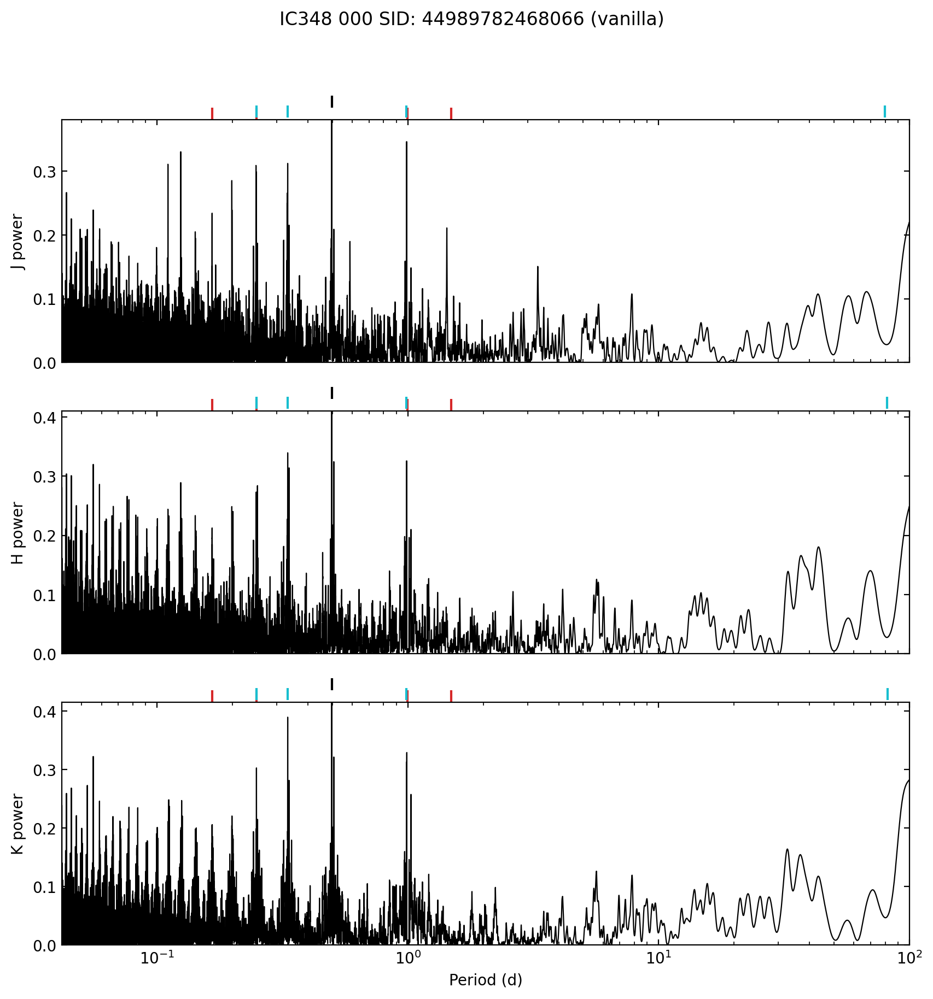

<Figure size 432x288 with 0 Axes>

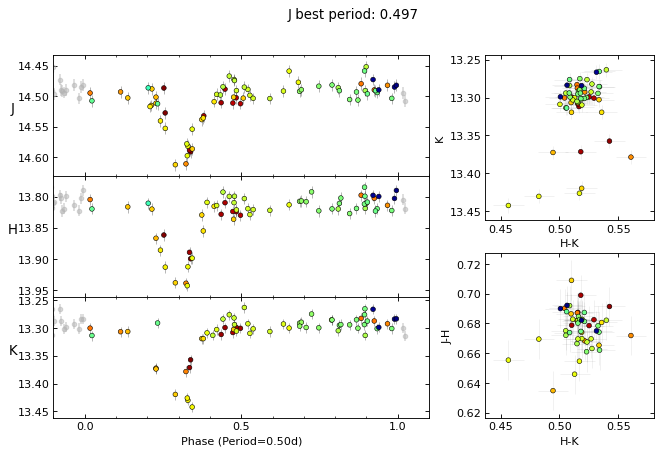

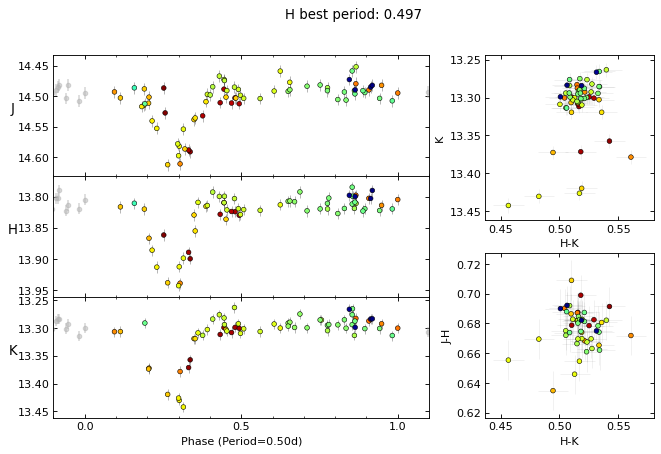

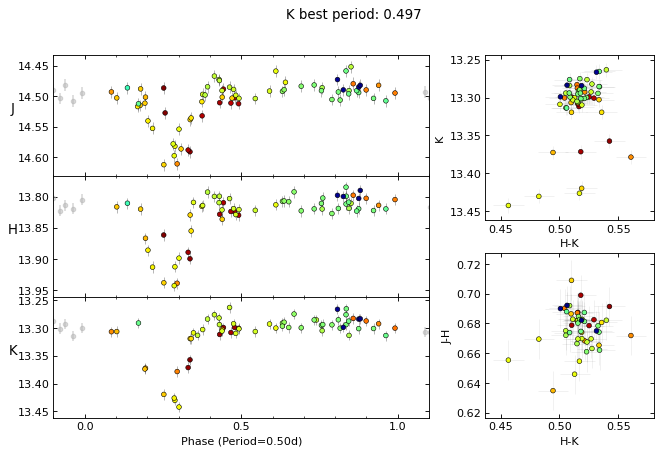

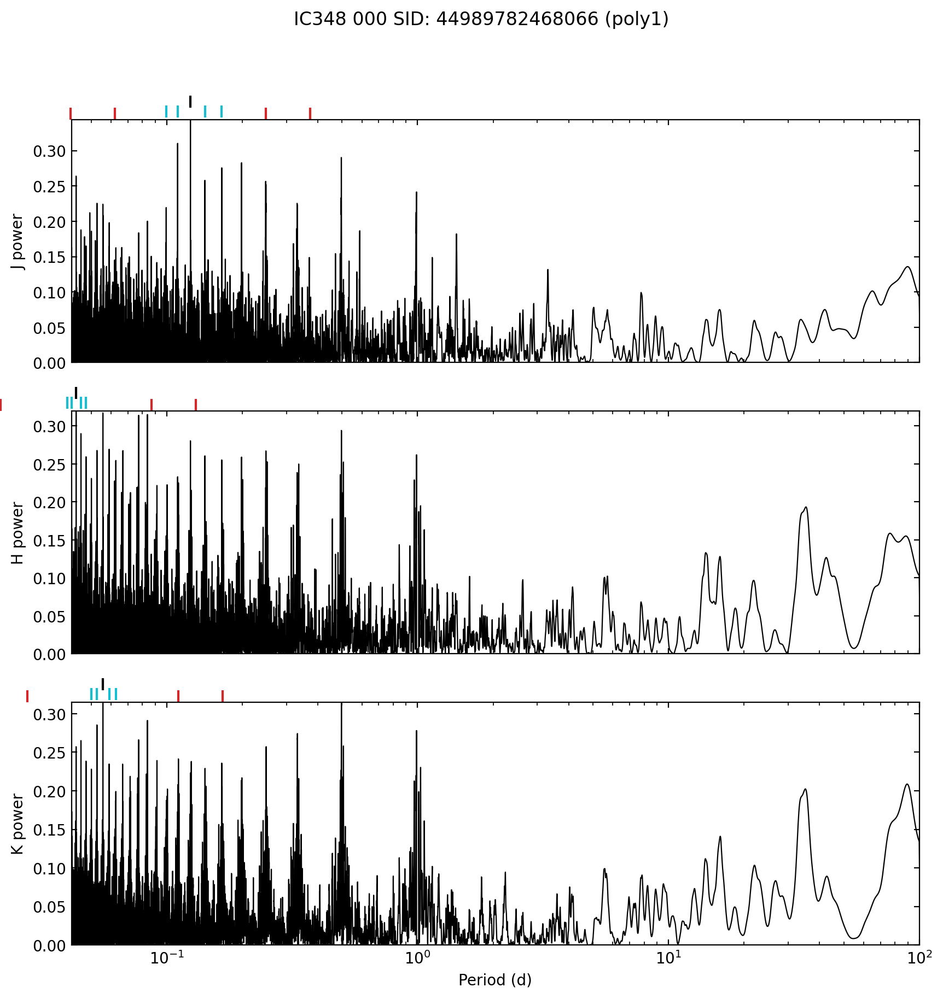

<Figure size 432x288 with 0 Axes>

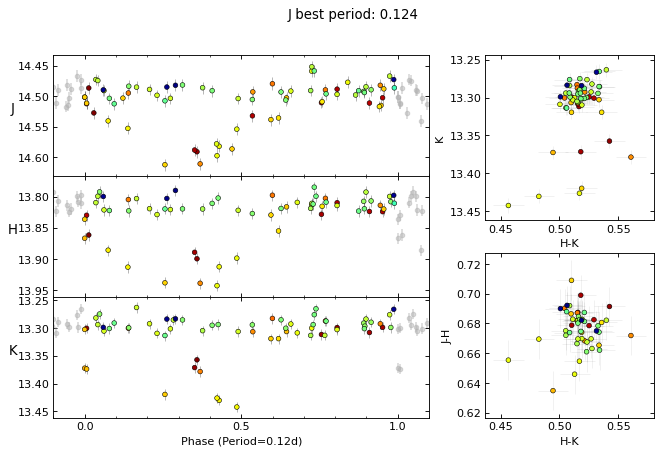

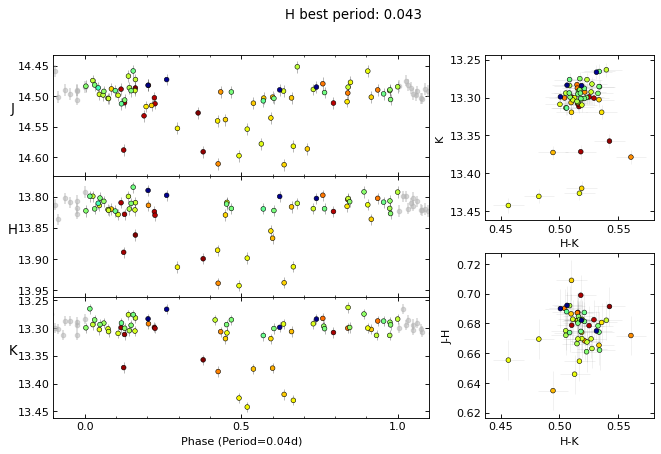

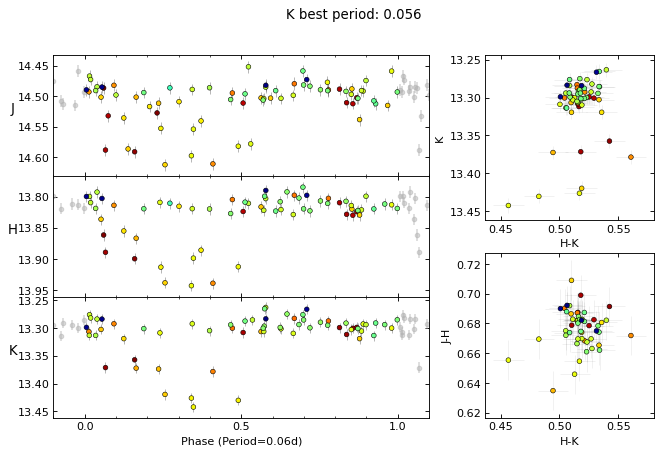

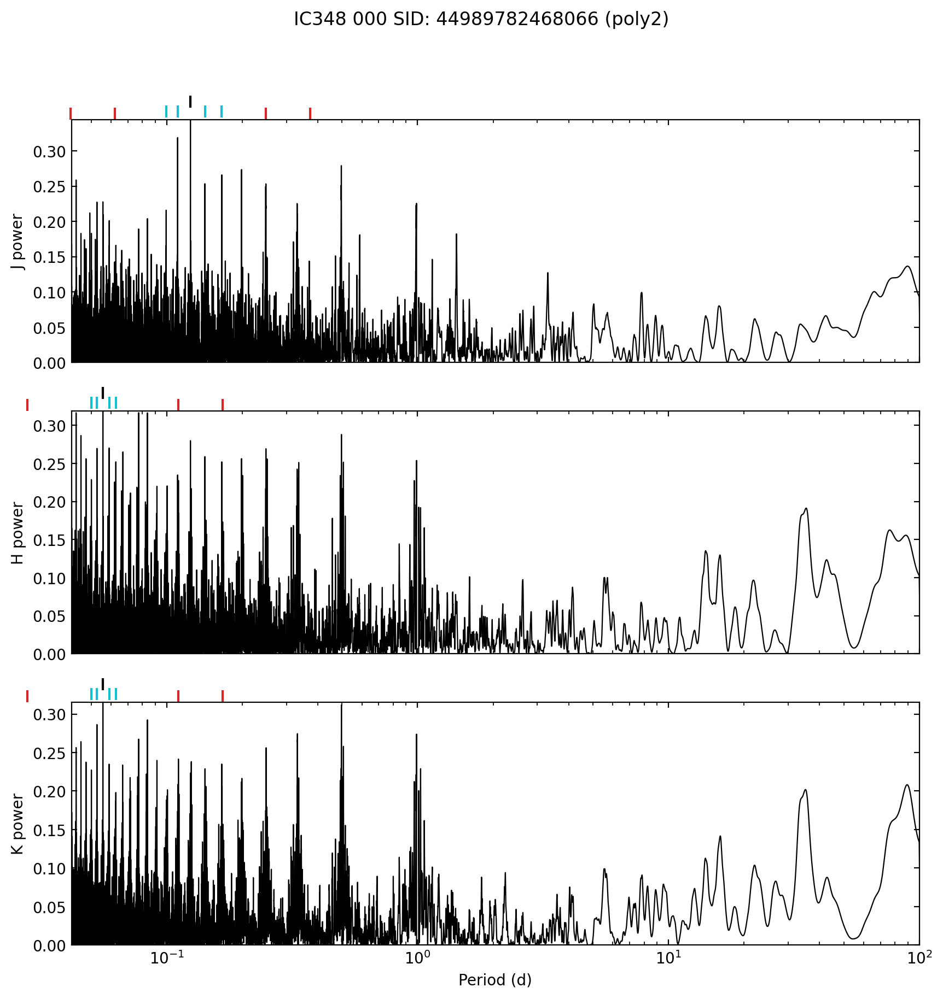

<Figure size 432x288 with 0 Axes>

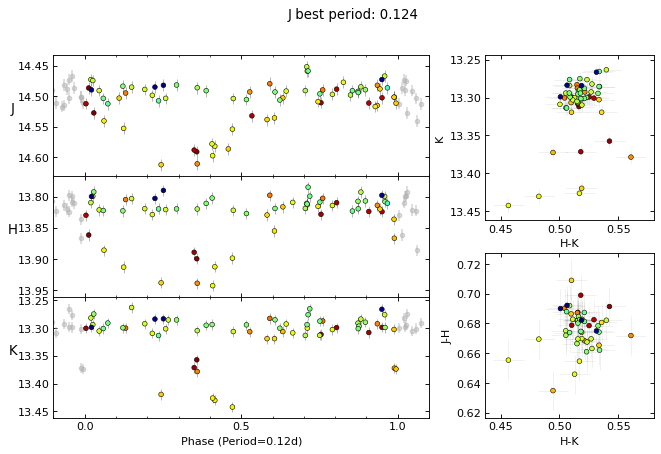

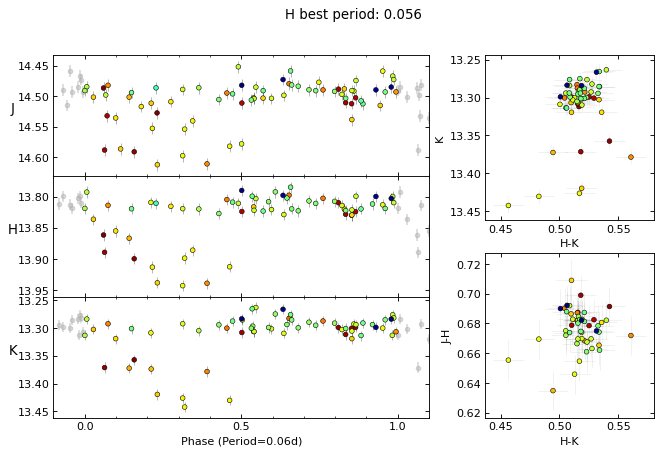

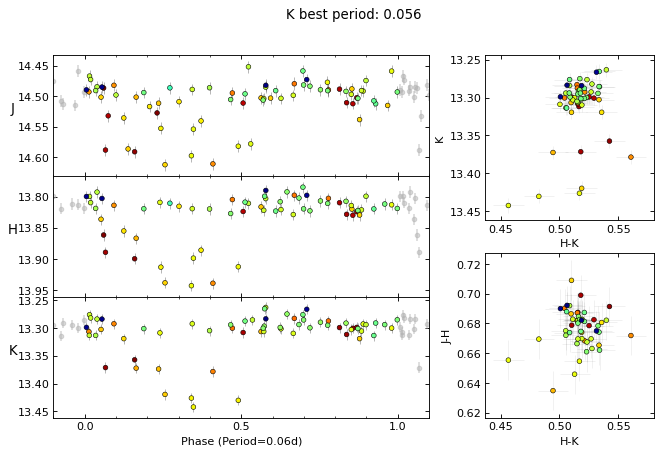

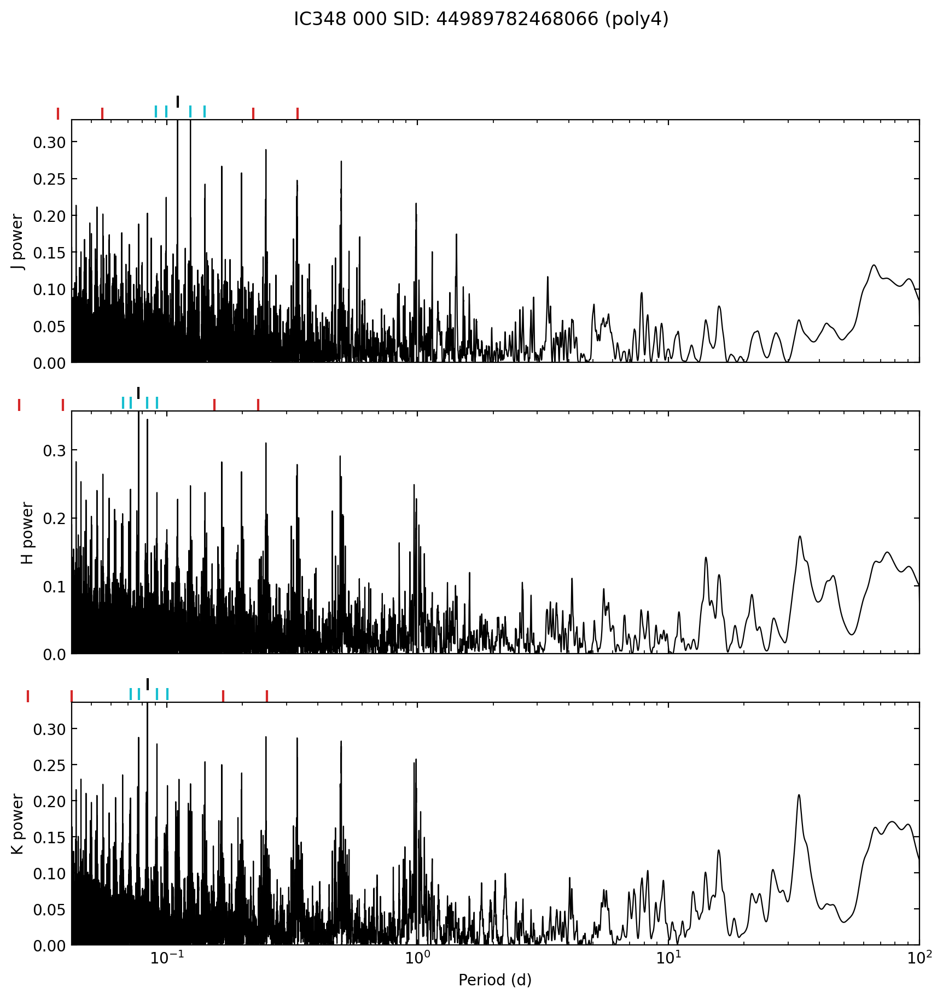

<Figure size 432x288 with 0 Axes>

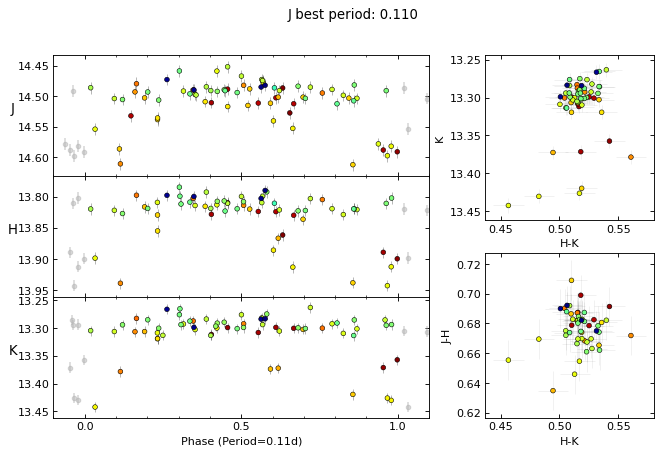

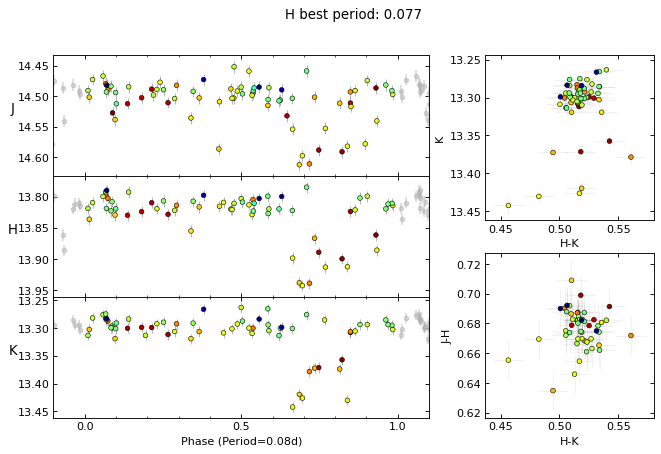

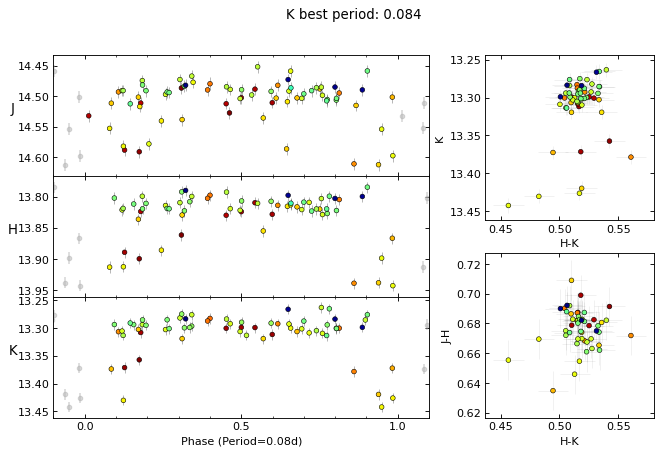

In [150]:
%run ../bd_period_script_customIC348_v2_EB.py


In [59]:
# For export to NASA Periodogram Service

dat_raw.write('export_IC348_EB.tbl', format= 'ascii.ipac')

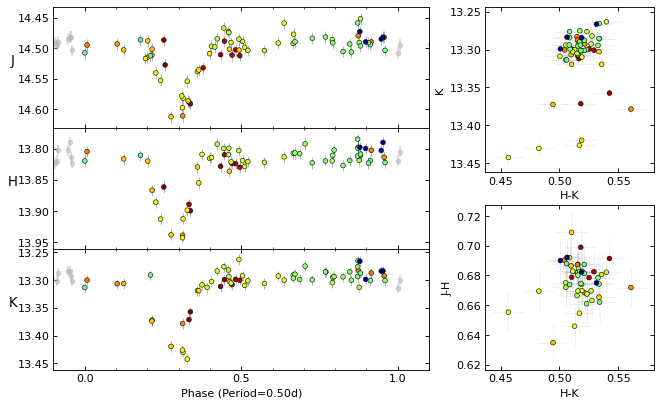

In [74]:
p = 0.49691984

lc_fig = simple_phased_lc_scatter_gridspec(
    ic_dat, sid, p, cmap="jet_r"
)


In [75]:
super_raw_ic_data = astropy.table.Table.read("/Users/tsrice/Documents/Variability_Project_2020/wuvars/Data/Raw_Downloads/wserv8.fits.gz")

In [81]:
raw = super_raw_ic_data[super_raw_ic_data['SOURCEID'] == sid]

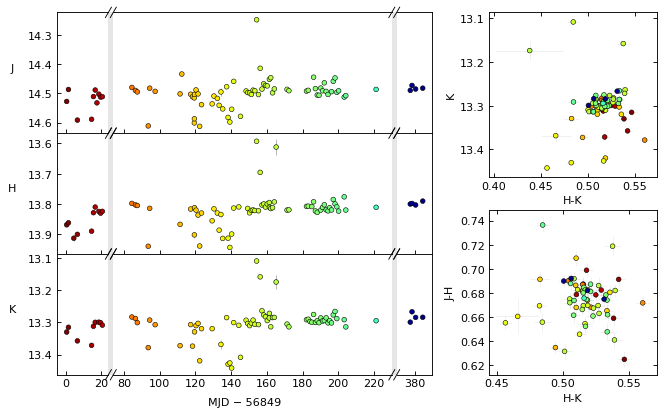

In [239]:
from wuvars.analysis.variability_selection import data_nuller
from astropy.table import Table

# raw_tab = raw.group_by("SOURCEID")
# raw_dat = raw.to_pandas()
df = raw.to_pandas()
data_nuller(df)
dat_again = Table.from_pandas(df)
dat_by_source = dat_again.group_by("SOURCEID")
# raw_dg = raw_dat.groupby("SOURCEID")

g_lc = ic348_simple_lc_scatter_brokenaxes(dat_by_source, sid, cmap='jet_r')


In [282]:
sid_near = 44989782468065

for row in ic_match.all_matches:
    if row['SOURCEID'] == sid_near:
#         print(row)
        print(f"Name: {row['Name']}")
        print(f"    AKA: {row['Luhman']}")
        print(f"    AKA: {row['Evans']}")
        print(f"    AKA: {row['Stelzer']}")
        print(f"    AKA: {row['AlvesdeOliveira']}")
        print(f"    AKA: {row['OtherNames']}")
        print(f"UKIRT SOURCEID: {row['SOURCEID']}")
        c = SkyCoord(ra= row['median_RA'], dec=row['median_DEC'], unit=u.rad)
        print(f"RA/Dec: {c.to_string('hmsdms')}")    
        print(f"JHK mags: J={row['median_JAPERMAG3']:.2f} H={row['median_HAPERMAG3']:.2f} K={row['median_KAPERMAG3']:.2f}")            
        print(f"Spectral type: {row['Adopt']}")
        print(f"Infrared excess: {row['IRexc']}")

Name: IC 348 IRS J03441925+3207347
    AKA: LRL 99 A
    AKA: [EDJ2009] 391
    AKA: CXOU J034419.24+320734.6
    AKA: --
    AKA: --
UKIRT SOURCEID: 44989782468065
RA/Dec: 03h44m19.24s +32d07m34.6932s
JHK mags: J=-- H=-- K=--
Spectral type: M3.75
Infrared excess: yes


In [258]:
raw_near = super_raw_ic_data[super_raw_ic_data['SOURCEID'] == sid_near]

df_near = raw_near.to_pandas()
data_nuller(df_near, max_flags=600000)
dat_again_near = Table.from_pandas(df_near)
dat_by_source_near = dat_again_near.group_by("SOURCEID")


Text(0.5, 0.98, '44989782468065')

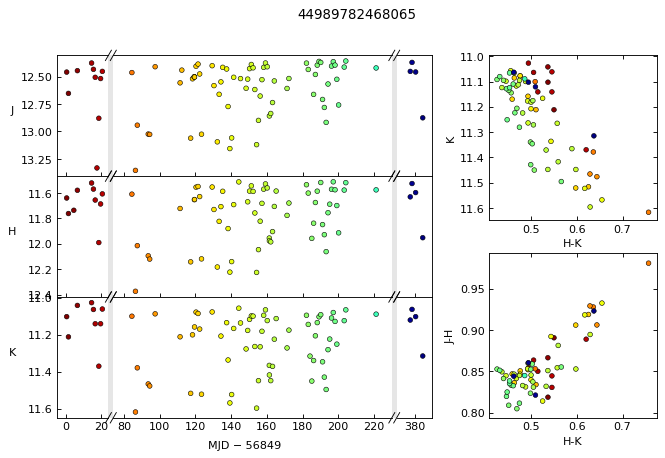

In [267]:
fig_lc = ic348_simple_lc_scatter_brokenaxes(dat_by_source_near, sid_near, cmap='jet_r')
fig_lc.suptitle(f"{sid_near}")

Text(0.5, 0.98, '44989782468066 folded on P=7.60453')

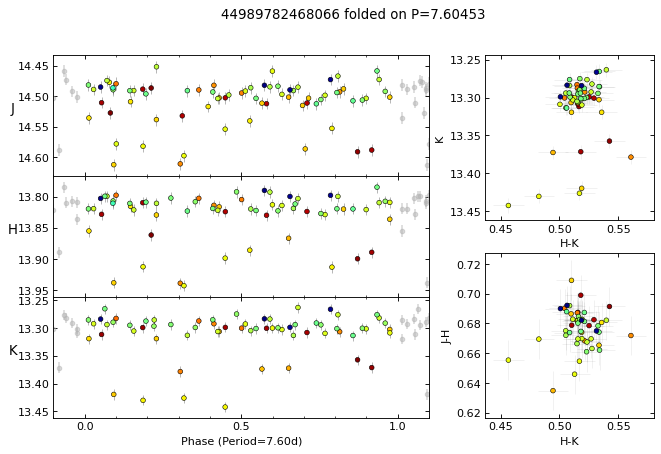

In [285]:
fig = simple_phased_lc_scatter_gridspec(
    ic_dat, sid, 7.604531051964512, cmap="jet_r"
)
fig.suptitle(f"{sid} folded on P={7.604531051964512:.5f}")

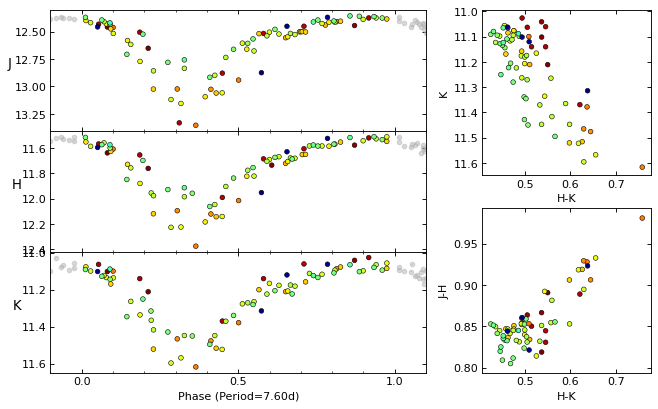

In [275]:
fig = simple_phased_lc_scatter_gridspec(
    dat_by_source_near, sid_near, 7.604531051964512, cmap="jet_r"
)


J Best fit period: 7.604531051964512
m_aliases: [0.2630011  0.06575027 0.39450164 0.04383352]
n_aliases: [0.86849945 1.13150055 1.86849945 2.13150055]



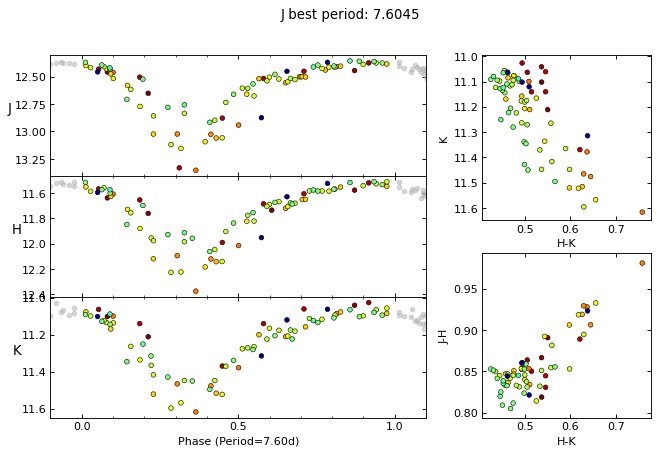

H Best fit period: 7.604531051964512
m_aliases: [0.2630011  0.06575027 0.39450164 0.04383352]
n_aliases: [0.86849945 1.13150055 1.86849945 2.13150055]



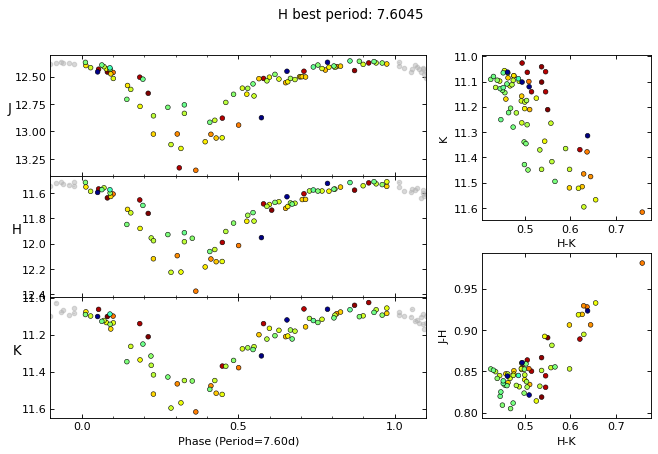

K Best fit period: 7.5987525329280645
m_aliases: [0.2632011  0.06580027 0.39480165 0.04386685]
n_aliases: [0.86839945 1.13160055 1.86839945 2.13160055]



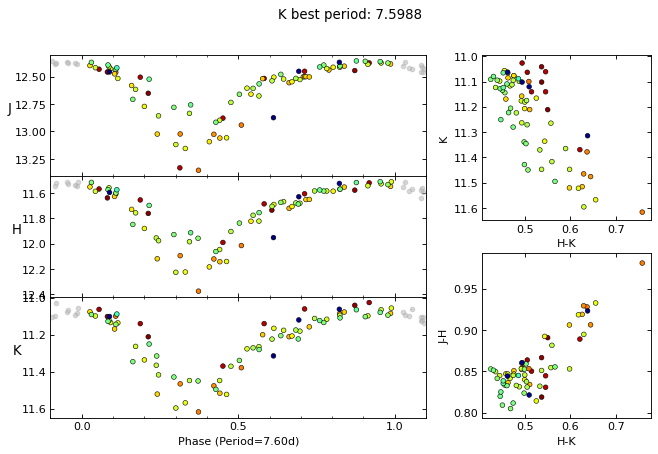

In [264]:
dat = dat_by_source_near

bands = ["J", "H", "K"]

for band in bands:

    mask = dat[f"{band}APERMAG3"].mask
    times = dat["MEANMJDOBS"][~mask]
    mags_raw = dat[f"{band}APERMAG3"][~mask]
    errs = dat[f"{band}APERMAG3ERR"][~mask]
    
    mags = mags_raw
    
    
    ls = LombScargle(times, mags, dy=errs, nterms=1)
    power = ls.power(freq, assume_regular_frequency=True).value

    min_freq = 1 / 100
    power[freq < min_freq] = 0
    power[np.abs(freq - 1) < 0.01] = 0

    powermax = np.nanmax(power)
    fmax = freq[np.nanargmax(power)]
#     fap = ls.false_alarm_probability(np.nanmax(power)).value

    amp = np.sqrt(np.sum(ls.model_parameters(fmax)[1:3] ** 2))
    # print(ls.model_parameters(fmax), amp)

    # find aliases
    m_aliases = np.array(find_m_aliases(fmax))
    n_aliases = np.array(find_n_aliases(fmax))
    
    print(f"{band} Best fit period: {1/fmax}")
    print(f"m_aliases: {m_aliases}")
    print(f"n_aliases: {n_aliases}")
    print("")

    fig = simple_phased_lc_scatter_gridspec(
        dat_by_source_near, sid_near, 1/fmax, cmap="jet_r"
    )
    fig.suptitle(f"{band} best period: {1/fmax:.4f}")
    
#     for m_alias in m_aliases:
        
#         fig = simple_phased_lc_scatter_gridspec(
#             ic_dat, sid, 1/m_alias, cmap="jet_r"
#         )
#         fig.suptitle(f"{band} alias period: {1/m_alias:.4f}")    
        
#     for n_alias in n_aliases:
        
#         fig = simple_phased_lc_scatter_gridspec(
#             ic_dat, sid, 1/n_alias, cmap="jet_r"
#         )
#         fig.suptitle(f"{band} alias period: {1/n_alias:.4f}")    
    plt.show()

In [242]:
raw.group_by("SOURCEID")[sid_near]

IndexError: index 44989782468065 out of range for table with length 89

[(12.0, 10.0), (12.0, 10.0), (12.0, 10.0)]

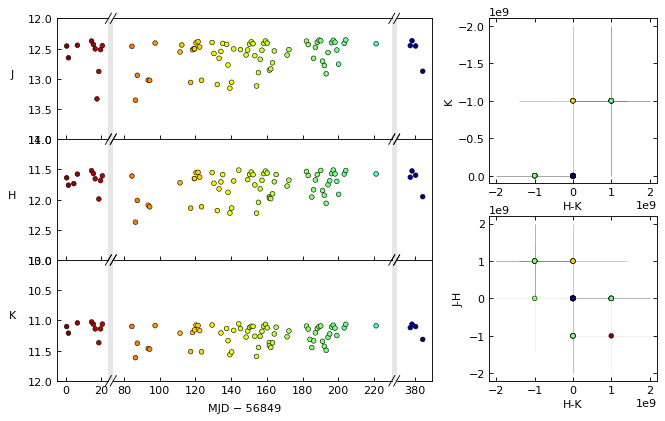

In [251]:
sid_near = 44989782468065
raw_near = super_raw_ic_data[super_raw_ic_data['SOURCEID'] == sid_near]

g_lc_near = ic348_simple_lc_scatter_brokenaxes(raw_near.group_by("SOURCEID"), sid_near, cmap='jet_r')
g_lc_near.ax_j.set_ylim(14,12)
g_lc_near.ax_h.set_ylim(13,11)
g_lc_near.ax_k.set_ylim(12,10)

In [252]:
super_raw_ic_data[super_raw_ic_data['SOURCEID'] == sid_near]

SOURCEID,MEANMJDOBS,RA,DEC,JMHPNT,JMHPNTERR,HMKPNT,HMKPNTERR,JAPERMAG3,JAPERMAG3ERR,HAPERMAG3,HAPERMAG3ERR,KAPERMAG3,KAPERMAG3ERR,JPPERRBITS,HPPERRBITS,KPPERRBITS,MERGEDCLASS,PSTAR
,,RADIANS,RADIANS,,,,,,,,,,,,,,,
int64,float64,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int32,int32,int32,int16,float32
44989782468065,56849.6246933,0.9787835648812697,0.5607098078470921,0.81875515,0.0020484454,0.536994,0.001753348,12.458052,0.0016852986,11.639297,0.0011644298,11.102303,0.0013108519,524304,524304,524304,-1,0.9996572
44989782468065,56850.6163667,0.9787834225891685,0.5607098011062547,0.89063454,0.0024231568,0.55019474,0.0017581396,12.652249,0.0021268765,11.761615,0.0011610707,11.21142,0.0013202158,524304,524304,524304,-1,0.9996572
44989782468065,56853.61551,0.9787834565779167,0.5607098084173837,-999999500.0,-999999500.0,-999999500.0,-999999500.0,-999999500.0,-999999500.0,11.736033,0.0023762586,-999999500.0,-999999500.0,0,524304,0,0,0.05
44989782468065,56855.62772,0.9787835867722086,0.5607098064271674,0.866477,0.0018636814,0.53683853,0.001372956,12.445013,0.0016120513,11.578536,0.0009351999,11.0416975,0.0010051911,524304,524304,524304,-1,0.9996572
44989782468065,56863.57628,0.9787835390728759,0.5607097938224392,0.8542137,0.0018481428,0.4943428,0.0014462234,12.375387,0.0015707874,11.5211735,0.00097378576,11.026831,0.0010692537,524304,524304,524304,-1,0.9996572
44989782468065,56864.62028,0.978783539823802,0.5607097661931552,0.86360073,0.001798792,0.5056534,0.0013509494,12.432858,0.0015497865,11.569258,0.00091313454,11.063604,0.0009956151,524304,524304,524304,-1,0.9996572
44989782468065,56865.6201867,0.9787835254024895,0.5607097496421,0.85007,0.002013717,0.5149059,0.0014711563,12.505583,0.0017429,11.655513,0.0010086407,11.140607,0.001070955,524304,524304,524304,-1,0.9996572
44989782468065,56866.58027,0.9787835432126467,0.5607097556457236,-999999500.0,-999999500.0,-999999500.0,-999999500.0,13.332525,0.002935917,-999999500.0,-999999500.0,-999999500.0,-999999500.0,524304,0,0,-1,0.9


In [95]:
dat_by_source.write('export_IC348_EB_RAW.tbl', format= 'ascii.ipac')

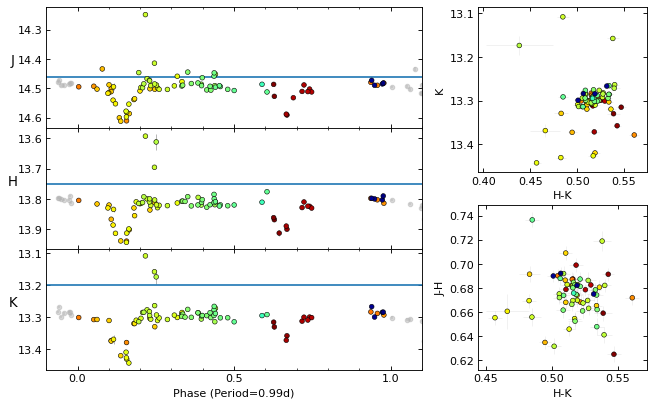

In [269]:
p = 0.49691984 * 2

lc_fig = simple_phased_lc_scatter_gridspec(
    dat_by_source, sid, p, cmap="jet_r"
)

lc_fig.ax_j.axhline(14.46)
lc_fig.ax_h.axhline(13.75)
lc_fig.ax_k.axhline(13.2)

In [272]:
dat_by_source

SOURCEID,MEANMJDOBS,RA,DEC,JMHPNT,JMHPNTERR,HMKPNT,HMKPNTERR,JAPERMAG3,JAPERMAG3ERR,HAPERMAG3,HAPERMAG3ERR,KAPERMAG3,KAPERMAG3ERR,JPPERRBITS,HPPERRBITS,KPPERRBITS,MERGEDCLASS,PSTAR
int64,float64,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float64,int16,float32
44989782468066,56849.6246933,0.978766920633636,0.5607147532726844,0.6590309,0.0062029194,0.53868866,0.006585223,14.527565,0.0047457954,13.868534,0.0039942004,13.329845,0.0052356017,16.0,16.0,16.0,-1,0.9996572
44989782468066,56850.6163667,0.9787668296737049,0.5607147993826794,0.62496185,0.006579132,0.54684067,0.0056191096,14.486761,0.0054749856,13.861799,0.0036482199,13.314959,0.004273744,16.0,16.0,16.0,-1,0.9996572
44989782468066,56853.61551,0.9787670324572356,0.5607148758457134,--,--,--,--,--,--,13.912695,0.009628653,--,--,--,16.0,--,-1,0.9
44989782468066,56855.62772,0.978766886286749,0.5607148239260568,0.6913271,0.0054887435,0.5425253,0.0045306627,14.591259,0.004591366,13.899932,0.0030076012,13.357407,0.0033883979,16.0,16.0,16.0,-1,0.9996572
44989782468066,56863.57628,0.9787668849921316,0.5607147755788611,0.6988878,0.005990369,0.5181551,0.0052798945,14.58842,0.0047914684,13.889532,0.003595323,13.371377,0.003866644,16.0,16.0,16.0,-1,0.9996572
44989782468066,56864.62028,0.9787668328582277,0.5607147748255779,0.68235016,0.005072466,0.5166521,0.0042618606,14.510867,0.0042226315,13.828517,0.0028105685,13.311865,0.0032037727,16.0,16.0,16.0,-1,0.9996572
44989782468066,56865.6201867,0.9787668501501262,0.560714743157287,0.67872334,0.005471192,0.5104637,0.0044632656,14.48865,0.00456336,13.809927,0.0030182255,13.299463,0.003288017,16.0,16.0,16.0,-1,0.9996572
44989782468066,56866.58027,0.9787668353421116,0.56071474409132,--,--,--,--,14.5323515,0.0054114177,--,--,--,--,16.0,--,--,-1,0.9
44989782468066,56867.62559,0.978766872563776,0.5607147731688944,0.67847824,0.0050637336,0.5252094,0.0043978505,14.5028,0.004184035,13.824322,0.002852236,13.299112,0.003347512,16.0,16.0,16.0,-1,0.9996572


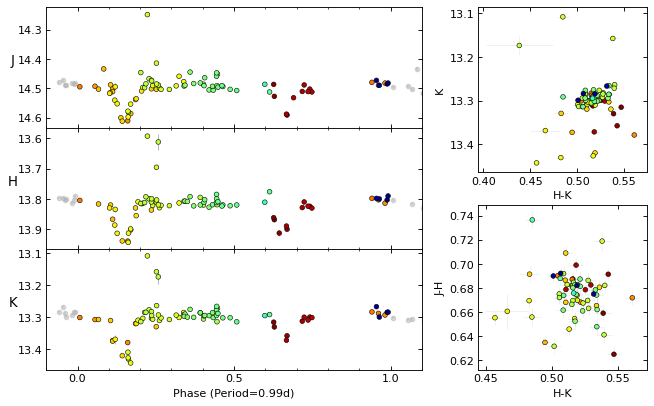

In [113]:
p = 0.4969 * 2

lc_fig = simple_phased_lc_scatter_gridspec(
    dat_by_source, sid, p, cmap="jet_r"
)


In [127]:
# crude_raw_filtering

# lc_fig.ax_j.axhline(14.46)
# lc_fig.ax_h.axhline(13.75)
# lc_fig.ax_k.axhline(13.2)

del_ = ((dat_by_source['JAPERMAG3'] < 14.46) | (dat_by_source['HAPERMAG3'] < 13.75) | (dat_by_source['KAPERMAG3'] < 13.2))

crudely_cleaned = dat_by_source.copy()
crudely_cleaned['JAPERMAG3'][del_] = np.nan
crudely_cleaned['HAPERMAG3'][del_] = np.nan
crudely_cleaned['KAPERMAG3'][del_] = np.nan

crudely_cleaned['JAPERMAG3'][del_].mask = True
crudely_cleaned['HAPERMAG3'][del_].mask = True
crudely_cleaned['KAPERMAG3'][del_].mask = True

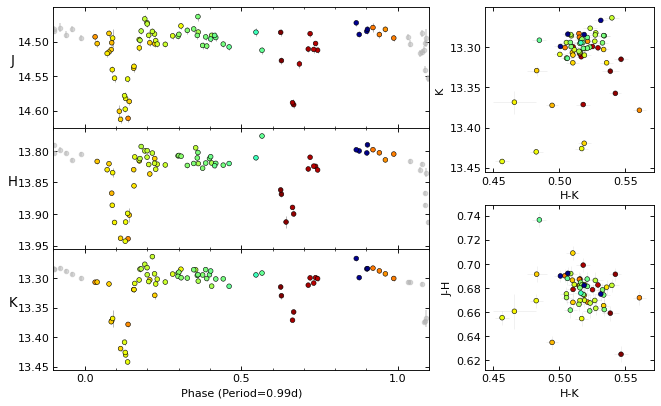

In [134]:
p = 0.99402768

lc_fig = simple_phased_lc_scatter_gridspec(
    crudely_cleaned, sid, p, cmap="jet_r"
)

In [129]:
crudely_cleaned['JAPERMAG3'][del_]

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


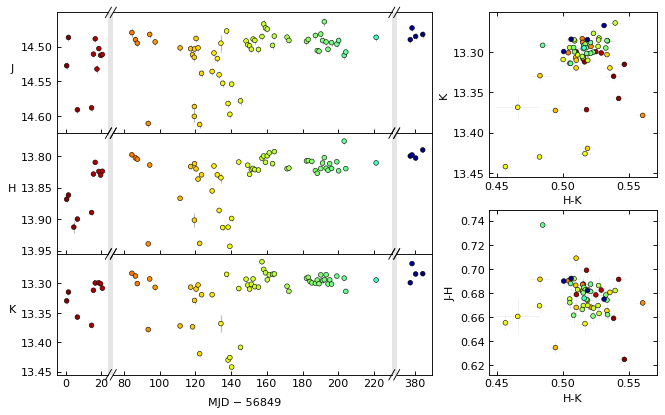

In [130]:
crude_lc = ic348_simple_lc_scatter_brokenaxes(crudely_cleaned, sid, cmap='jet_r')

In [133]:
crudely_cleaned[np.isfinite(crudely_cleaned['JAPERMAG3'])].write('export_IC348_EB_RAW_crudely_cleaned.tbl', format= 'ascii.ipac')

In [141]:
try_these_periods =  [0.4968677457,  0.9942014196,  0.3313391795,  0.2482937625,  0.6625938349,  0.1985340484,  0.1242245114,  0.3970377490,  1.9850218194,  0.2571559758,  0.1420619834,  0.1471859229,  0.0946115281,  0.0587477376,  0.2841352326,  0.1656254869,  0.0655219240,  0.0661610336,  2.9491913317,  0.1397935453, ]

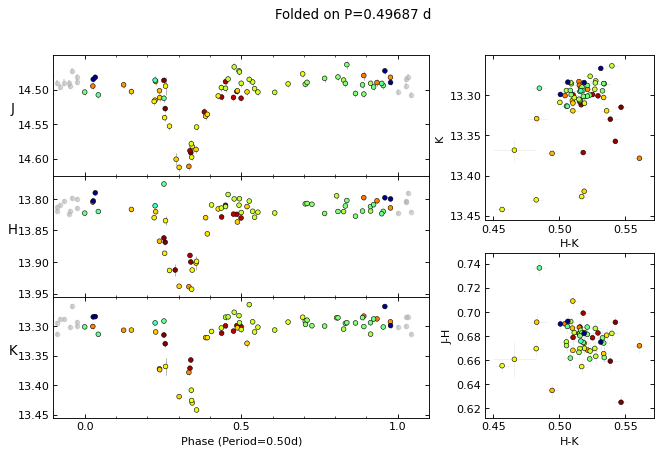

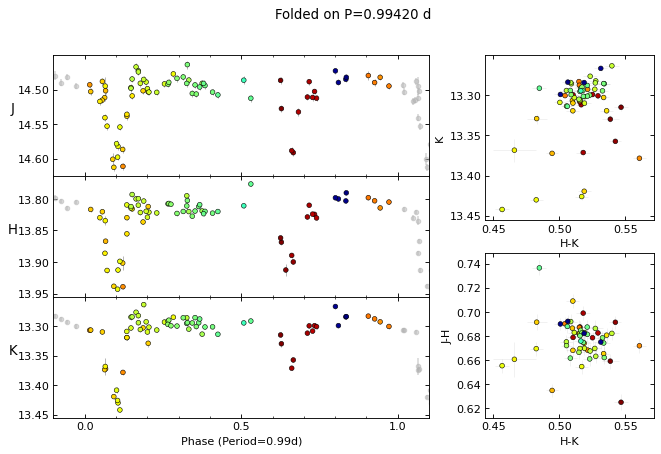

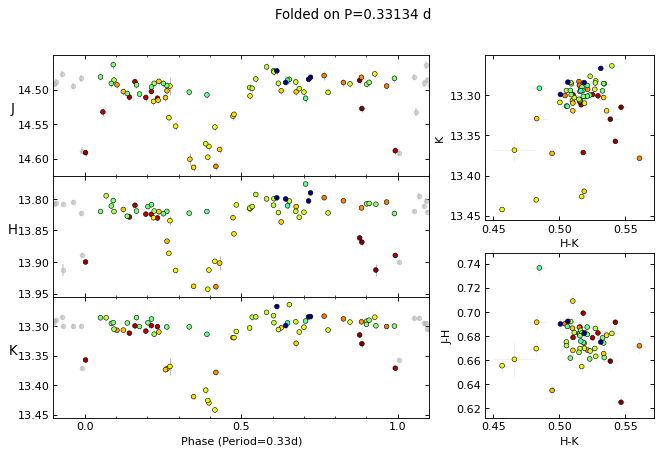

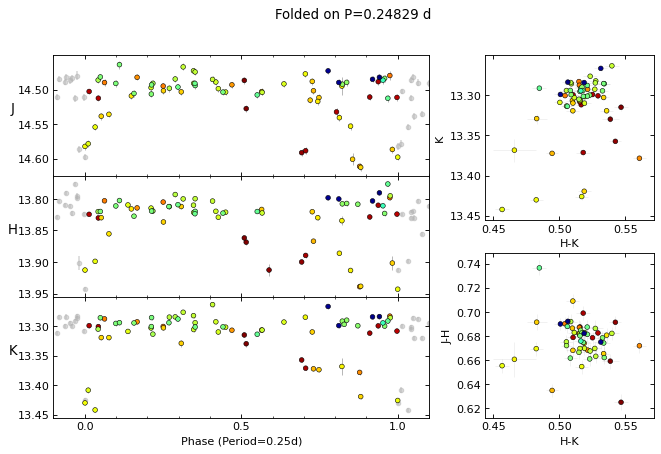

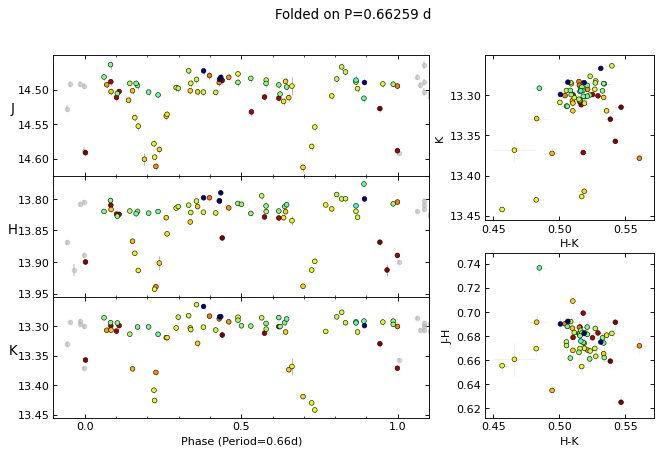

...

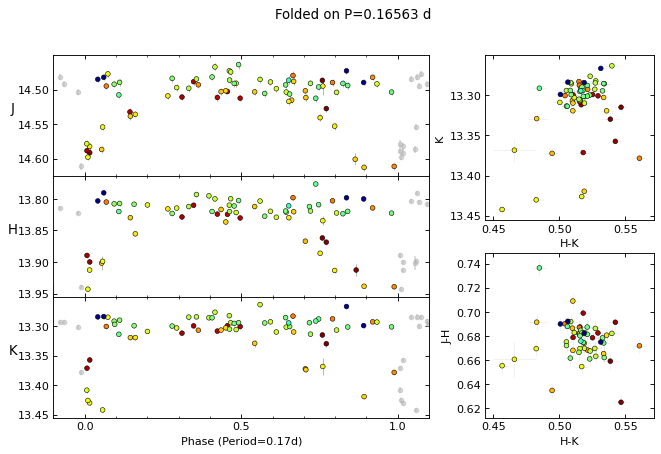

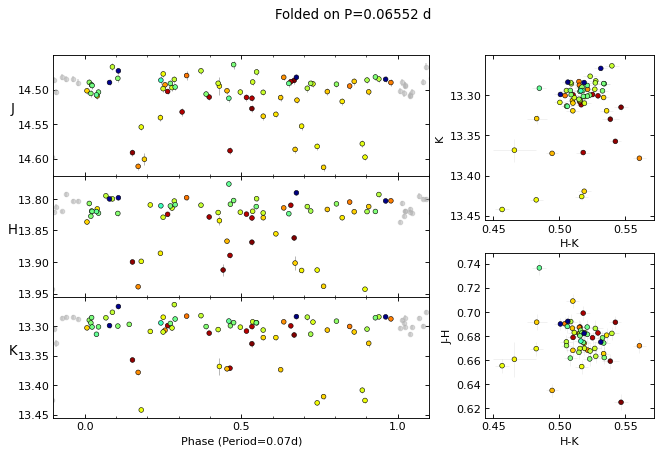

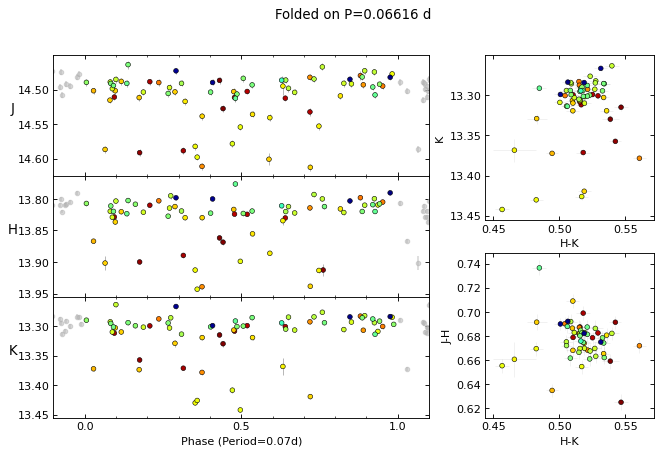

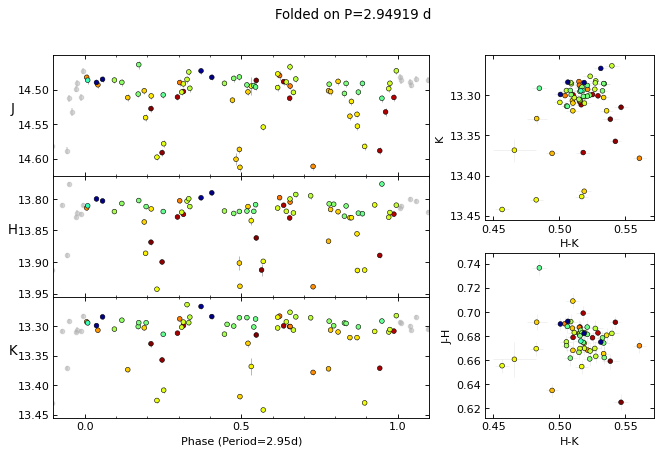

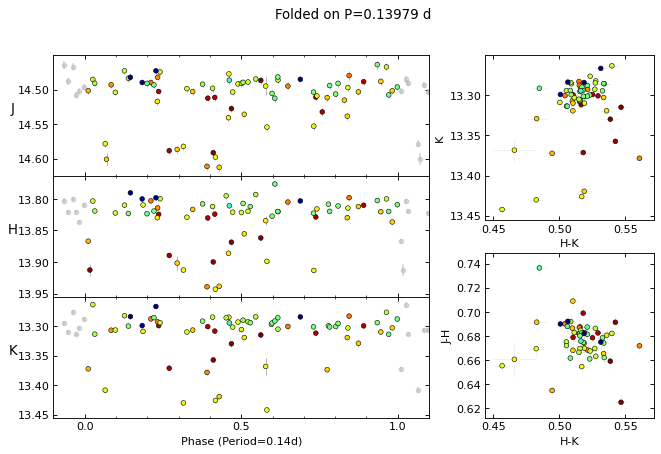

In [148]:
for p in try_these_periods:
    lc_fig = simple_phased_lc_scatter_gridspec(
        crudely_cleaned, sid, p, cmap="jet_r"
    )
    lc_fig.suptitle(f"Folded on P={p:.5f} d")

In [146]:


crudely_cleaned[np.isfinite(crudely_cleaned['JAPERMAG3']) & (crudely_cleaned['MEANMJDOBS'] < 160 + 56849)].write('export_IC348_EB_RAW_crudely_cleaned_firsthalf.tbl', format= 'ascii.ipac')

Text(0.5, 0.98, 'Folded on P=0.99433 d')

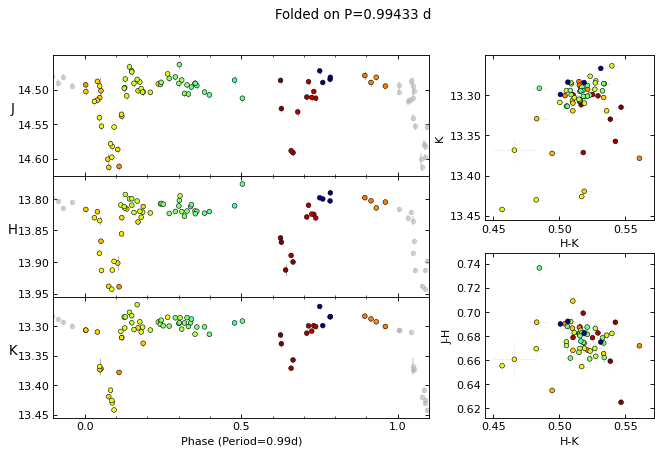

In [153]:
p = 0.99433230

lc_fig = simple_phased_lc_scatter_gridspec(
    crudely_cleaned, sid, p, cmap="jet_r"
)
lc_fig.suptitle(f"Folded on P={p:.5f} d")

Text(0.5, 0.98, 'Folded on P=0.33244 d')

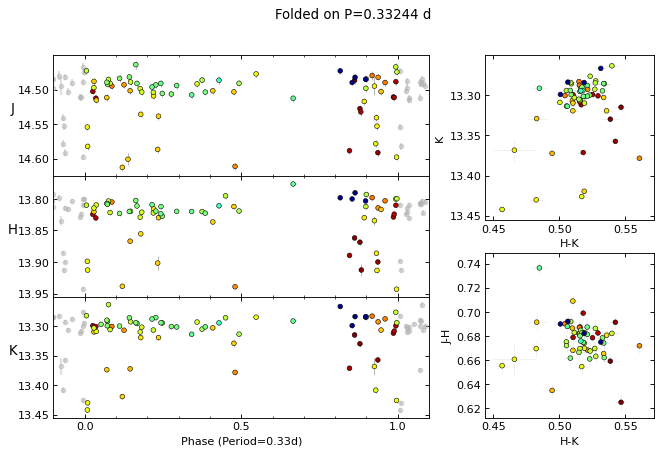

In [159]:
p = 0.99433230 / 3 + 0.001

lc_fig = simple_phased_lc_scatter_gridspec(
    crudely_cleaned, sid, p, cmap="jet_r"
)
lc_fig.suptitle(f"Folded on P={p:.5f} d")

In [179]:
late = crudely_cleaned['MEANMJDOBS'] > 150 + 56849

mean_j = np.nanmean(crudely_cleaned['JAPERMAG3'][late])
mean_h = np.nanmean(crudely_cleaned['HAPERMAG3'][late])
mean_k = np.nanmean(crudely_cleaned['KAPERMAG3'][late])

print(mean_j, mean_h, mean_k)


# mean = ((dat_by_source['MEANMJDOBS'] > 14.46) | (dat_by_source['HAPERMAG3'] < 13.75) | (dat_by_source['KAPERMAG3'] < 13.2))

crazy_cleaned = crudely_cleaned.copy()
crazy_cleaned['JAPERMAG3'][late & np.isfinite(crudely_cleaned['JAPERMAG3'])] = mean_j
crazy_cleaned['HAPERMAG3'][late & np.isfinite(crudely_cleaned['HAPERMAG3'])] = mean_h
crazy_cleaned['KAPERMAG3'][late & np.isfinite(crudely_cleaned['KAPERMAG3'])] = mean_k

# crudely_cleaned['JAPERMAG3'][del_].mask = True
# crudely_cleaned['HAPERMAG3'][del_].mask = True
# crudely_cleaned['KAPERMAG3'][del_].mask = True

crazy_cleaned[np.isfinite(crazy_cleaned['JAPERMAG3'])].write('export_IC348_EB_RAW_crazy_cleaned.tbl', format= 'ascii.ipac')

14.490238 13.810704 13.293234


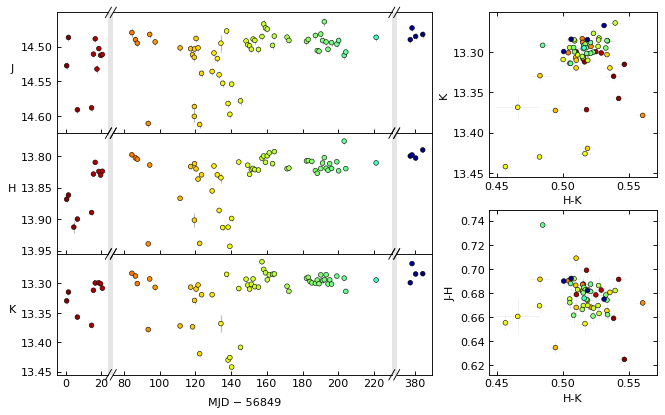

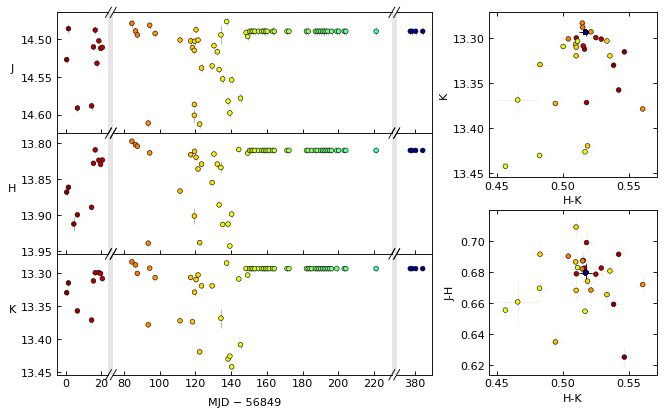

In [180]:
crude_lc = ic348_simple_lc_scatter_brokenaxes(crudely_cleaned, sid, cmap='jet_r')
crazy_lc = ic348_simple_lc_scatter_brokenaxes(crazy_cleaned, sid, cmap='jet_r')

Text(0.5, 0.98, 'Folded on P=0.49687 d')

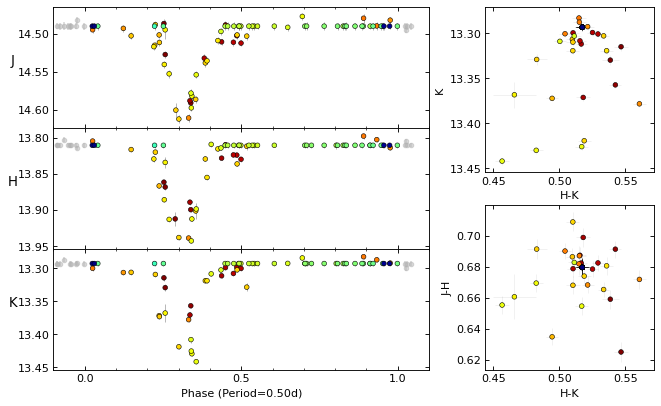

In [183]:
p = 0.49686972
crazy_phase = simple_phased_lc_scatter_gridspec(
    crazy_cleaned, sid, p, cmap="jet_r"
)
lc_fig.suptitle(f"Folded on P={p:.5f} d")

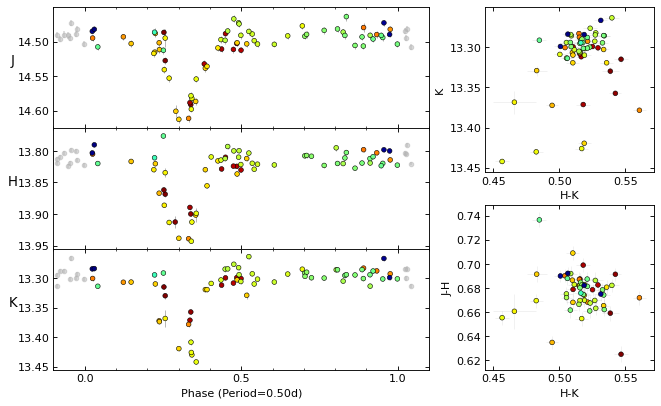

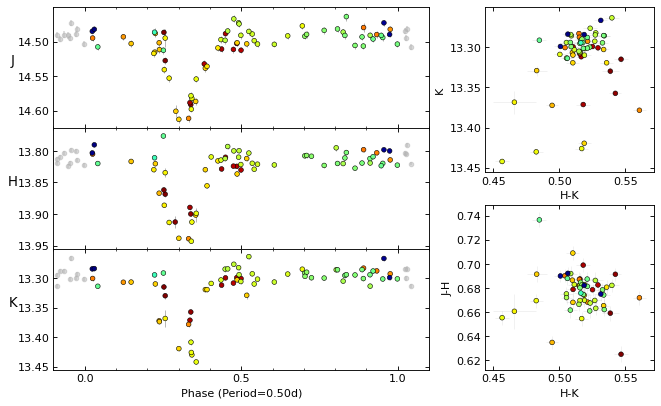

In [184]:
simple_phased_lc_scatter_gridspec(
    crudely_cleaned, sid, p, cmap="jet_r"
)

Text(0.5, 0.98, 'Folded on P=0.99374 d')

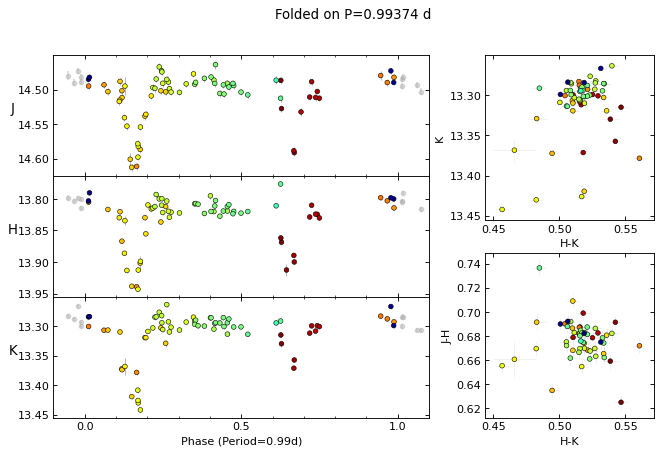

In [189]:
p2 = 0.49686972*2

simple_phased_lc_scatter_gridspec(
    crudely_cleaned, sid, p2, cmap="jet_r"
)
plt.suptitle(f"Folded on P={p2:.5f} d")

Text(0.5, 0.98, 'Folded on P=0.99374 d')

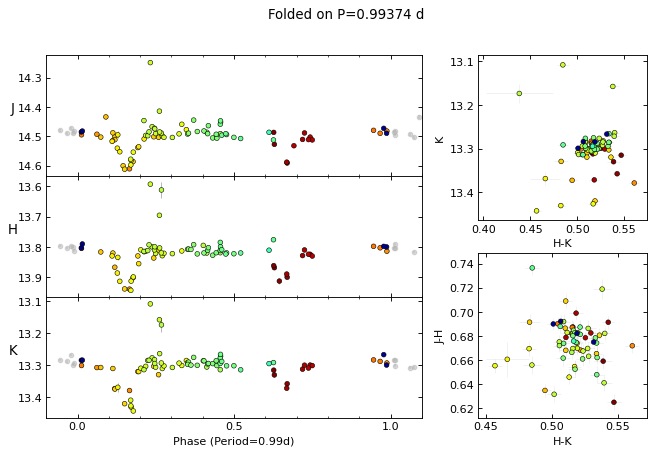

In [197]:
simple_phased_lc_scatter_gridspec(
    dat_by_source, sid, p2, cmap="jet_r"
)
plt.suptitle(f"Folded on P={p2:.5f} d")

Text(0.5, 0.98, 'Folded on P=0.99374 d (P=23.8497 hr)')

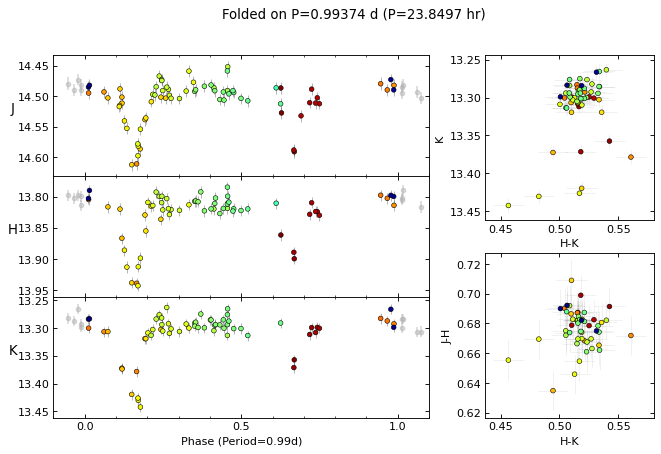

In [192]:
simple_phased_lc_scatter_gridspec(
    ic_dat, sid, p2, cmap="jet_r"
)
plt.suptitle(f"Folded on P={p2:.5f} d (P={24 * p2:.4f} hr)")

In [200]:
sid2 = 44989782458863
raw2 = super_raw_ic_data[super_raw_ic_data['SOURCEID'] == sid2]
df2 = raw2.to_pandas()
data_nuller(df2)
dat_again2 = Table.from_pandas(df2)
dat_by_source2 = dat_again2.group_by("SOURCEID")

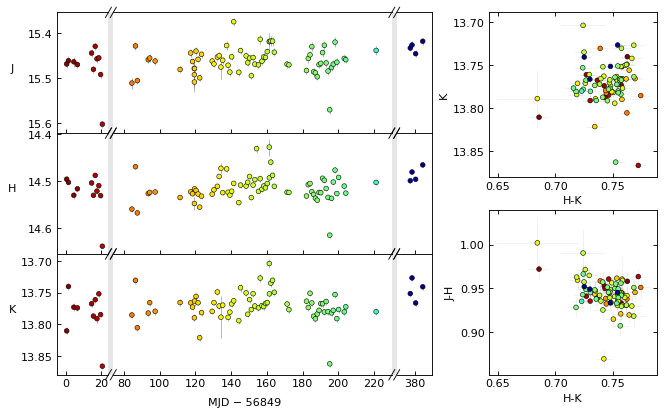

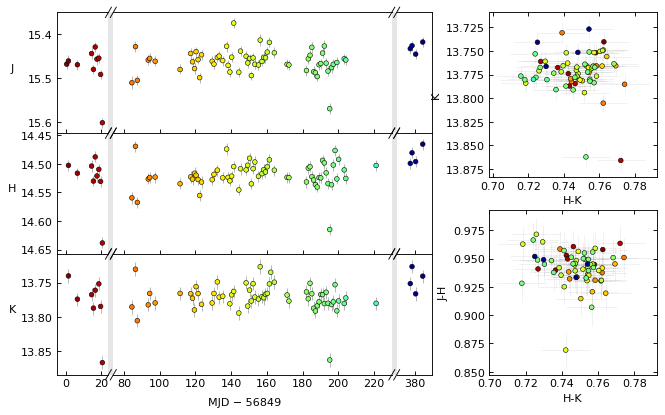

In [202]:
sid2_lc_raw = ic348_simple_lc_scatter_brokenaxes(dat_by_source2, sid2, cmap='jet_r')
sid2_lc_clean = ic348_simple_lc_scatter_brokenaxes(ic_dat, sid2, cmap='jet_r')

J Best fit period: 0.13955507331323733
m_aliases: [14.33125971  3.58281493 21.49688957  2.38854329]
n_aliases: [6.16562986 8.16562986 5.16562986 9.16562986]



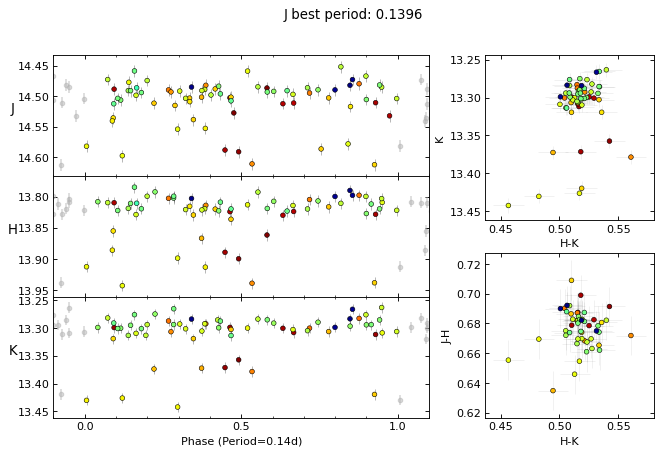

H Best fit period: 0.04544774547944541
m_aliases: [44.00658336 11.00164584 66.00987504  7.33443056]
n_aliases: [21.00329168 23.00329168 20.00329168 24.00329168]



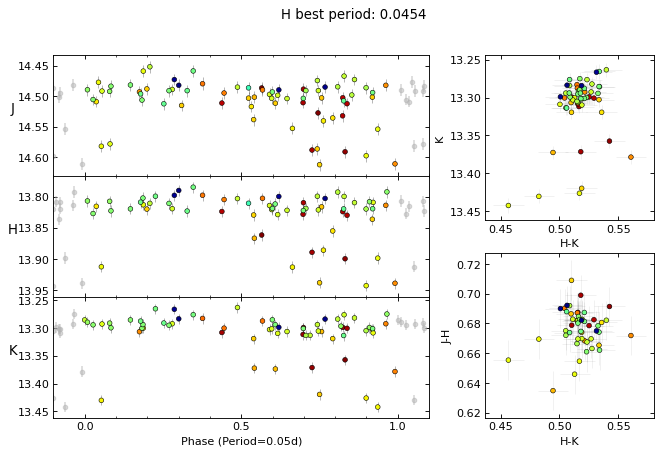

K Best fit period: 0.21746130984741402
m_aliases: [ 9.19703832  2.29925958 13.79555748  1.53283972]
n_aliases: [3.59851916 5.59851916 2.59851916 6.59851916]



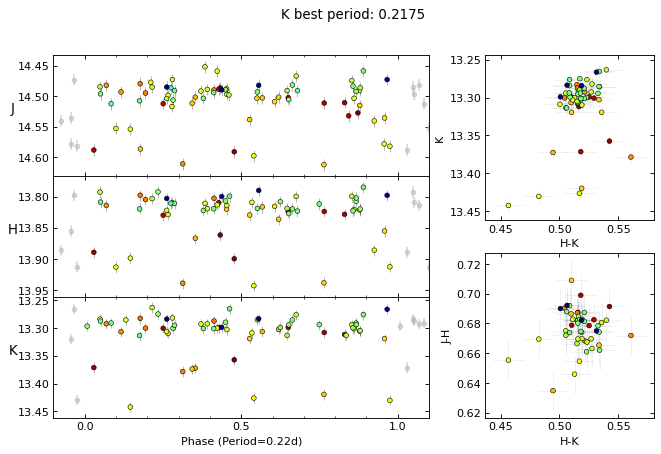

In [204]:
# let's do a LSP

dg = ic_dat
dat_raw2 = dg.groups[dg.groups.keys["SOURCEID"] == sid2]
dat = dat_raw2

bands = ["J", "H", "K"]

for band in bands:

    mask = dat[f"{band}APERMAG3"].mask
    times = dat["MEANMJDOBS"][~mask]
    mags_raw = dat[f"{band}APERMAG3"][~mask]
    errs = dat[f"{band}APERMAG3ERR"][~mask]
    
    mags = mags_raw
    
    
    ls = LombScargle(times, mags, dy=errs, nterms=1)
    power = ls.power(freq, assume_regular_frequency=True).value

    min_freq = 1 / 100
    power[freq < min_freq] = 0
    power[np.abs(freq - 1) < 0.01] = 0

    powermax = np.nanmax(power)
    fmax = freq[np.nanargmax(power)]
#     fap = ls.false_alarm_probability(np.nanmax(power)).value

    amp = np.sqrt(np.sum(ls.model_parameters(fmax)[1:3] ** 2))
    # print(ls.model_parameters(fmax), amp)

    # find aliases
    m_aliases = np.array(find_m_aliases(fmax))
    n_aliases = np.array(find_n_aliases(fmax))
    
    print(f"{band} Best fit period: {1/fmax}")
    print(f"m_aliases: {m_aliases}")
    print(f"n_aliases: {n_aliases}")
    print("")

    fig = simple_phased_lc_scatter_gridspec(
        ic_dat, sid2, 1/fmax, cmap="jet_r"
    )
    fig.suptitle(f"{band} best period: {1/fmax:.4f}")
    
#     for m_alias in m_aliases:
        
#         fig = simple_phased_lc_scatter_gridspec(
#             ic_dat, sid, 1/m_alias, cmap="jet_r"
#         )
#         fig.suptitle(f"{band} alias period: {1/m_alias:.4f}")    
        
#     for n_alias in n_aliases:
        
#         fig = simple_phased_lc_scatter_gridspec(
#             ic_dat, sid, 1/n_alias, cmap="jet_r"
n#         )
#         fig.suptitle(f"{band} alias period: {1/n_alias:.4f}")    
    plt.show()

# fig2 = 
# fig2.suptitle(f"{band} best period: {1/fmax:.3f}")
    

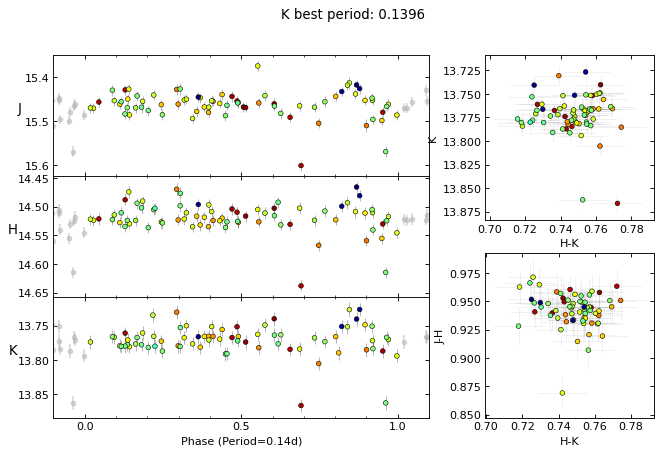

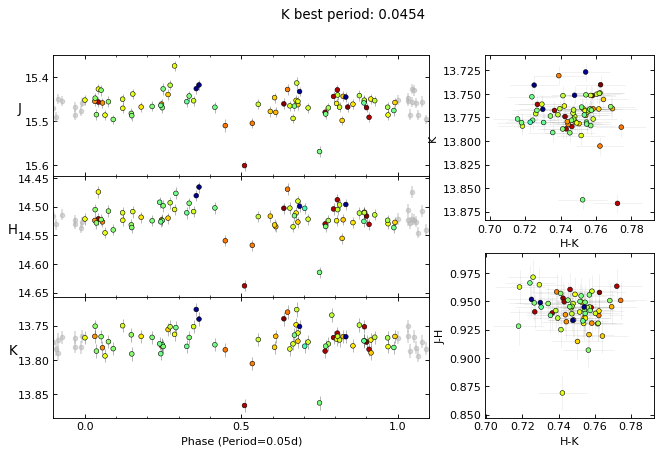

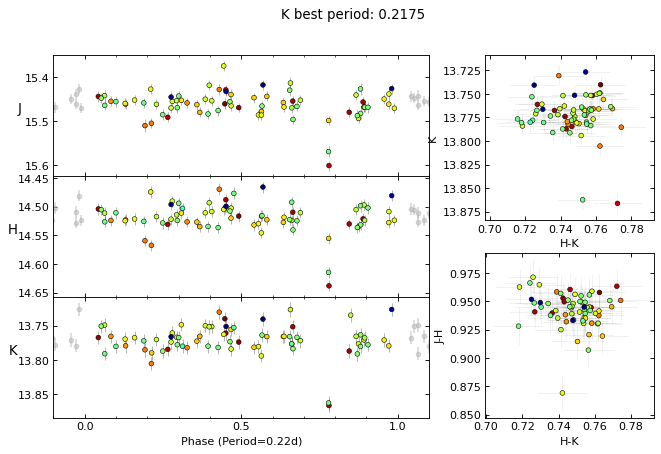

In [205]:
for per in [0.13955507331323733, 0.04544774547944541, 0.21746130984741402]:

    fig = simple_phased_lc_scatter_gridspec(
            ic_dat, sid2, per, cmap="jet_r"
        )
    fig.suptitle(f"{band} best period: {per:.4f}")

In [206]:
dat_raw2.write('export_IC348_EB_2.tbl', format= 'ascii.ipac')

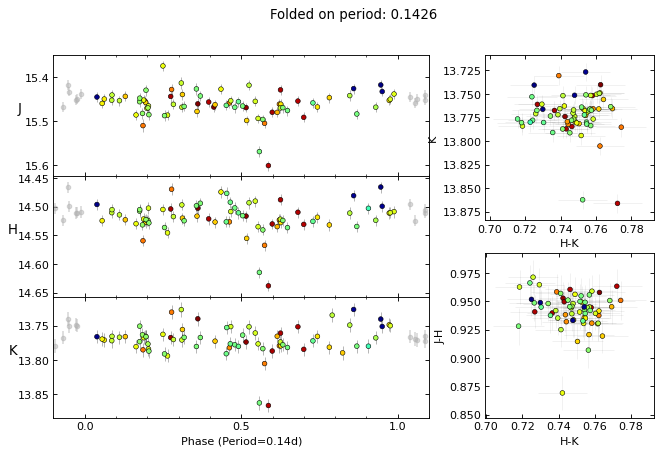

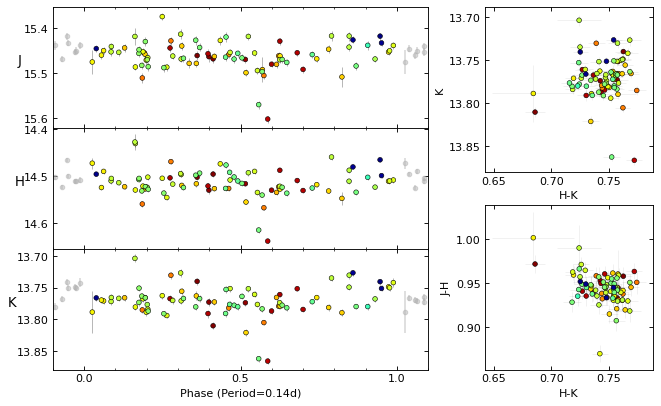

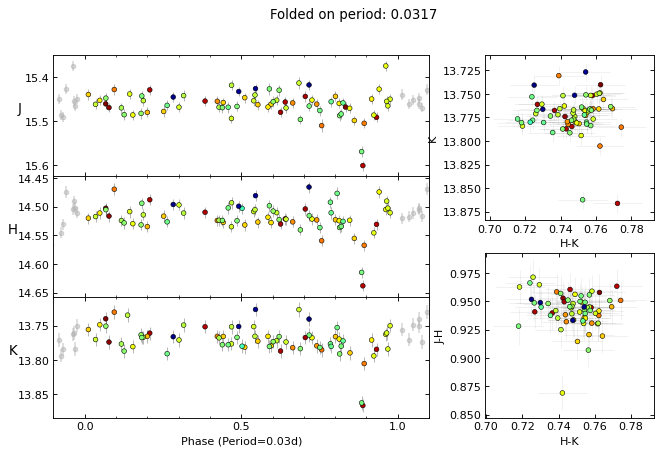

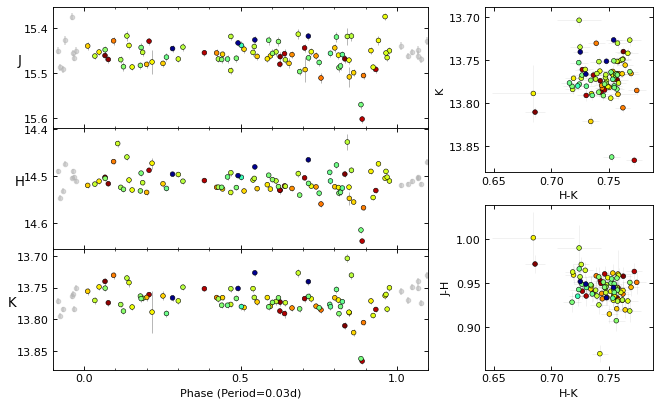

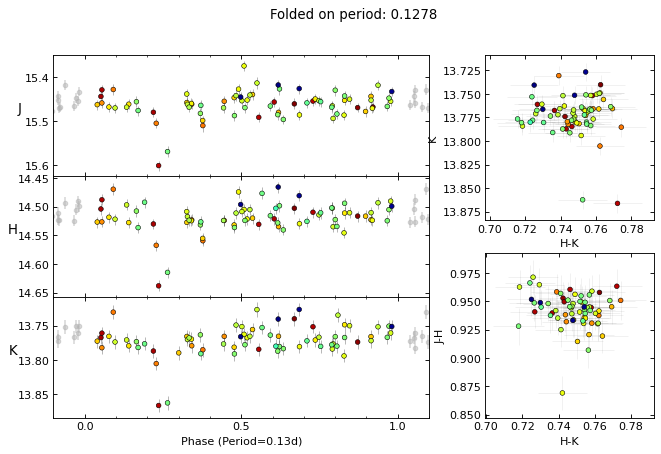

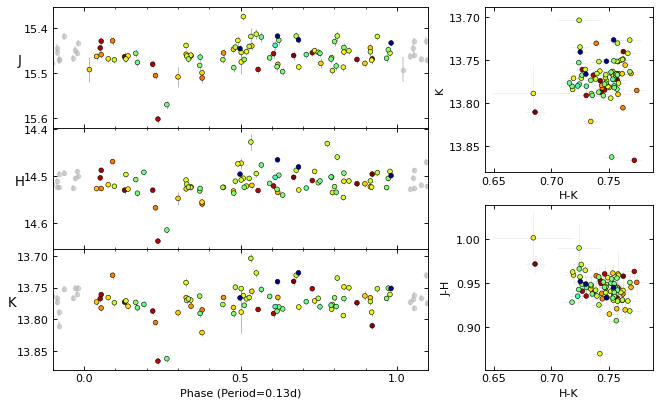

In [210]:
new_ps = [0.14255121, 0.03171472, 0.12783125]

for new_p in new_ps:
    
    fig = simple_phased_lc_scatter_gridspec(
            ic_dat, sid2, new_p, cmap="jet_r"
        )
    fig.suptitle(f"Folded on period: {new_p:.4f}")
    
    fig2 = simple_phased_lc_scatter_gridspec(
            dat_by_source2, sid2, new_p, cmap="jet_r"
        )
    

# Match to other catalog!

In [222]:
from wuvars.analysis.period_match import w1_litpertable, f1_litpertable, g1_litpertable


In [221]:
idx, d2d, d3d = c.match_to_catalog_sky(w1_litpertable.coords)
d2d.to(u.arcsec)

<Angle [3.20952146] arcsec>

In [223]:
idx, d2d, d3d = c.match_to_catalog_sky(f1_litpertable.coords)
d2d.to(u.arcsec)

<Angle [3.19342408] arcsec>

In [224]:
idx, d2d, d3d = c.match_to_catalog_sky(g1_litpertable.coords)
d2d.to(u.arcsec)

<Angle [83.77509836] arcsec>

In [226]:
fla_1 = astropy.table.Table.read("../literature_periods/Flaherty13_aj456236t1_mrt.txt", format='ascii')#, delimiter='\t', header_start=2, data_start=4, data_end=238)
fla_1_coords = SkyCoord(ra= fla_1['RAdeg'], dec=fla_1["DEdeg"], unit=u.deg)

In [227]:
idx, d2d, d3d = c.match_to_catalog_sky(fla_1_coords)
d2d.to(u.arcsec)

<Angle [0.82581999] arcsec>

In [229]:
fla_1[idx]

LRLL,RAdeg,DEdeg,Teff,L*,EW,Period,AV,LX,Excess,alpha,aIRAC,Dis,Var?,Ref
,deg,deg,K,Lsun,0.1 nm,d,mag,1e+21 W,,,,arcmin,,
str5,float64,float64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str2,str11
99B,56.0791,32.1268,3091,0.041,-10.0,-10.0,2.77,-10.0,-10.0,-2.84,-2.96,8.25,b,luh03
